# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 3.0MB/s eta 0:00:01
scikit-image 0.14.2 has requirement dask[array]>=1.0.0, but you'll have dask 0.16.1 which is incompatible.
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

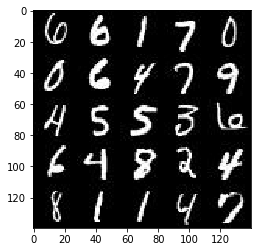

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

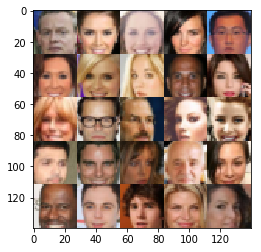

In [3]:
show_n_images = 25

"""

DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    # Rank 4 real input 
    # Rank 2 generated inputs

    inputs_real = tf.placeholder(tf.float32,shape=(None, image_width,image_height,image_channels),name='input_real')
    inputs_gen = tf.placeholder(tf.float32,shape=(None, z_dim),name='input_z')
    learning_rate = tf.placeholder(tf.float32,name='learning_rate')

    return (inputs_real, inputs_gen, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    # Use strided convolutions to downsample layers in line with DCGAN from class, no pooling
    # Need to accept 28x28x3, with 3 colour channnels for celeb dataset
    # Use leaky RELU to allow gradients to propogate
    # Use batch norm on all layers except first layer
    # Use alpha paramter in line with DCGAN in class
    
    with tf.variable_scope('discriminator', reuse=reuse):

            # Input layer is 32x32x3 for celeb faces
            # Downsample to 16x16x64
            conv1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
            relu1 = tf.maximum(alpha*conv1, conv1)
           
           #x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', activation=None, use_bias=True)
        
            # Output of 8x8x128
            conv2 = tf.layers.conv2d(relu1, 64, 5, strides=2, padding='same')
            bn2 = tf.layers.batch_normalization(conv2,training=True)
            relu2 = tf.maximum(alpha*bn2, bn2)      
            
            # Output of 4x4x256
            conv3 = tf.layers.conv2d(relu2, 64, 5, strides=2, padding='same')
            bn3 = tf.layers.batch_normalization(conv3,training=True)
            relu3 = tf.maximum(alpha*bn3, bn3) 
            
            # Flatten output
            flat = tf.reshape(relu3, (-1, 4*4*256))
            logits = tf.layers.dense(flat, 1)
            out = tf.sigmoid(logits)

            return out, logits  
        
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # Generate 28 array as 7*2*2 via valid padding on first layer
    # Upsample via strided convolutions 
    
    reuse = not is_train
    
    with tf.variable_scope('generator', reuse=reuse):
        
        # First fully connected layer of (3,3,512)
        x1 = tf.layers.dense(inputs=z, units=3*3*512)
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(alpha * bn1, bn1)
        
        # Second layer size (7,7,256)
        conv2 = tf.layers.conv2d_transpose(relu1, 256, 5, strides=1, padding='valid')
        bn2 = tf.layers.batch_normalization(conv2, training=is_train)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        # Third layer size (14,14,128)
        conv3 = tf.layers.conv2d_transpose(relu2, 128, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(conv3, training=is_train)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        # Output layer = 28x28xout_channel_dim
        logits = tf.layers.conv2d_transpose(relu3, out_channel_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        
        return out

    """
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    # Same functions as class videos

    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Same function as class videos
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    # Use class logic with show_generator_output fucntion
    
    alpha = 0.2
    print_every = 10
    show_every = 100
    steps = 0
    
    num_images, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, image_channels, alpha=alpha)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)      

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch in range(epoch_count):            
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # Scale batch images
                batch_images = batch_images * 2.0
                
                # Sample random noise for generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                if steps % print_every == 0:
                    # After print_every batches compute and print the losses 
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch + 1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 5.8425... Generator Loss: 0.0048
Epoch 1/2... Discriminator Loss: 4.0150... Generator Loss: 0.0368
Epoch 1/2... Discriminator Loss: 4.6778... Generator Loss: 0.0201
Epoch 1/2... Discriminator Loss: 2.8888... Generator Loss: 0.1384
Epoch 1/2... Discriminator Loss: 2.8105... Generator Loss: 0.1234
Epoch 1/2... Discriminator Loss: 1.4997... Generator Loss: 0.3623
Epoch 1/2... Discriminator Loss: 0.8987... Generator Loss: 1.0485
Epoch 1/2... Discriminator Loss: 0.7376... Generator Loss: 1.7010
Epoch 1/2... Discriminator Loss: 0.8475... Generator Loss: 0.8237
Epoch 1/2... Discriminator Loss: 0.9645... Generator Loss: 2.4101


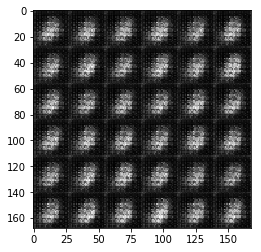

Epoch 1/2... Discriminator Loss: 1.1465... Generator Loss: 0.4741
Epoch 1/2... Discriminator Loss: 0.7754... Generator Loss: 1.0392
Epoch 1/2... Discriminator Loss: 0.6490... Generator Loss: 1.7936
Epoch 1/2... Discriminator Loss: 2.3708... Generator Loss: 0.2082
Epoch 1/2... Discriminator Loss: 1.5877... Generator Loss: 1.2530
Epoch 1/2... Discriminator Loss: 1.2116... Generator Loss: 0.5390
Epoch 1/2... Discriminator Loss: 1.1682... Generator Loss: 0.5379
Epoch 1/2... Discriminator Loss: 0.8723... Generator Loss: 1.0131
Epoch 1/2... Discriminator Loss: 0.6492... Generator Loss: 1.3723
Epoch 1/2... Discriminator Loss: 0.7083... Generator Loss: 1.2052


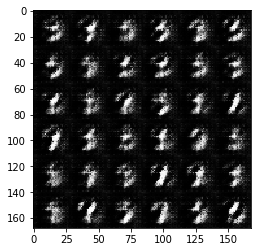

Epoch 1/2... Discriminator Loss: 0.9530... Generator Loss: 0.6832
Epoch 1/2... Discriminator Loss: 1.1400... Generator Loss: 0.5612
Epoch 1/2... Discriminator Loss: 1.6216... Generator Loss: 0.4042
Epoch 1/2... Discriminator Loss: 1.3894... Generator Loss: 0.3434
Epoch 1/2... Discriminator Loss: 1.6693... Generator Loss: 0.2390
Epoch 1/2... Discriminator Loss: 2.1644... Generator Loss: 0.2944
Epoch 1/2... Discriminator Loss: 1.2366... Generator Loss: 0.8184
Epoch 1/2... Discriminator Loss: 1.0294... Generator Loss: 1.4373
Epoch 1/2... Discriminator Loss: 1.1627... Generator Loss: 0.6956
Epoch 1/2... Discriminator Loss: 1.8834... Generator Loss: 0.2128


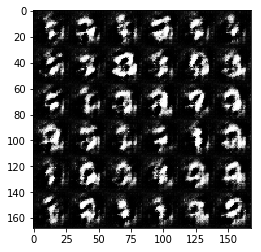

Epoch 1/2... Discriminator Loss: 1.6728... Generator Loss: 0.5346
Epoch 1/2... Discriminator Loss: 1.8918... Generator Loss: 0.2953
Epoch 1/2... Discriminator Loss: 1.8572... Generator Loss: 0.4914
Epoch 1/2... Discriminator Loss: 1.5961... Generator Loss: 0.3184
Epoch 1/2... Discriminator Loss: 1.7206... Generator Loss: 0.2334
Epoch 1/2... Discriminator Loss: 1.6369... Generator Loss: 0.9498
Epoch 1/2... Discriminator Loss: 1.5357... Generator Loss: 0.3997
Epoch 1/2... Discriminator Loss: 1.8053... Generator Loss: 0.2976
Epoch 1/2... Discriminator Loss: 1.3671... Generator Loss: 0.5560
Epoch 1/2... Discriminator Loss: 1.4720... Generator Loss: 0.4059


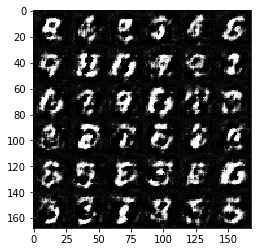

Epoch 1/2... Discriminator Loss: 1.3791... Generator Loss: 0.6776
Epoch 1/2... Discriminator Loss: 1.7523... Generator Loss: 0.5713
Epoch 1/2... Discriminator Loss: 1.6601... Generator Loss: 0.2951
Epoch 1/2... Discriminator Loss: 1.6134... Generator Loss: 0.8572
Epoch 1/2... Discriminator Loss: 1.4373... Generator Loss: 0.4295
Epoch 1/2... Discriminator Loss: 1.3653... Generator Loss: 0.8256
Epoch 1/2... Discriminator Loss: 1.4424... Generator Loss: 0.3717
Epoch 1/2... Discriminator Loss: 1.1958... Generator Loss: 0.5513
Epoch 1/2... Discriminator Loss: 1.4334... Generator Loss: 0.6871
Epoch 1/2... Discriminator Loss: 1.7798... Generator Loss: 0.2190


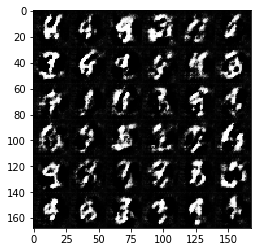

Epoch 1/2... Discriminator Loss: 1.5254... Generator Loss: 0.3229
Epoch 1/2... Discriminator Loss: 1.2088... Generator Loss: 0.5017
Epoch 1/2... Discriminator Loss: 1.5681... Generator Loss: 0.3059
Epoch 1/2... Discriminator Loss: 1.3038... Generator Loss: 0.4480
Epoch 1/2... Discriminator Loss: 1.0223... Generator Loss: 0.8074
Epoch 1/2... Discriminator Loss: 1.2719... Generator Loss: 0.4806
Epoch 1/2... Discriminator Loss: 1.1970... Generator Loss: 1.0478
Epoch 1/2... Discriminator Loss: 1.0618... Generator Loss: 0.9635
Epoch 1/2... Discriminator Loss: 1.1735... Generator Loss: 0.9910
Epoch 1/2... Discriminator Loss: 1.0041... Generator Loss: 0.6907


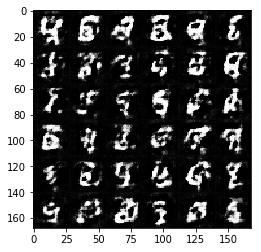

Epoch 1/2... Discriminator Loss: 1.1586... Generator Loss: 0.6742
Epoch 1/2... Discriminator Loss: 1.5884... Generator Loss: 0.2837
Epoch 1/2... Discriminator Loss: 0.9094... Generator Loss: 1.3071
Epoch 1/2... Discriminator Loss: 1.6396... Generator Loss: 1.5427
Epoch 1/2... Discriminator Loss: 1.6576... Generator Loss: 0.2573
Epoch 1/2... Discriminator Loss: 1.2937... Generator Loss: 0.8472
Epoch 1/2... Discriminator Loss: 0.9755... Generator Loss: 0.7584
Epoch 1/2... Discriminator Loss: 0.9755... Generator Loss: 1.0503
Epoch 1/2... Discriminator Loss: 1.1498... Generator Loss: 1.0788
Epoch 1/2... Discriminator Loss: 1.8026... Generator Loss: 0.2076


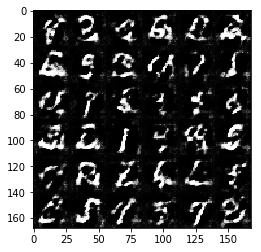

Epoch 1/2... Discriminator Loss: 1.7780... Generator Loss: 0.2016
Epoch 1/2... Discriminator Loss: 1.2997... Generator Loss: 0.6120
Epoch 1/2... Discriminator Loss: 1.4649... Generator Loss: 0.4079
Epoch 1/2... Discriminator Loss: 1.2095... Generator Loss: 0.7362
Epoch 1/2... Discriminator Loss: 1.8773... Generator Loss: 0.1876
Epoch 1/2... Discriminator Loss: 1.3346... Generator Loss: 0.4297
Epoch 1/2... Discriminator Loss: 1.4856... Generator Loss: 0.3599
Epoch 1/2... Discriminator Loss: 1.2728... Generator Loss: 0.3860
Epoch 1/2... Discriminator Loss: 1.2850... Generator Loss: 0.7557
Epoch 1/2... Discriminator Loss: 1.3351... Generator Loss: 0.4367


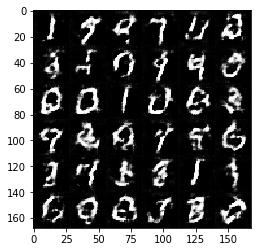

Epoch 1/2... Discriminator Loss: 2.0631... Generator Loss: 0.1480
Epoch 1/2... Discriminator Loss: 1.3935... Generator Loss: 0.3786
Epoch 1/2... Discriminator Loss: 1.4278... Generator Loss: 0.4083
Epoch 1/2... Discriminator Loss: 1.3897... Generator Loss: 0.4533
Epoch 1/2... Discriminator Loss: 1.6506... Generator Loss: 0.2446
Epoch 1/2... Discriminator Loss: 1.6394... Generator Loss: 0.2603
Epoch 1/2... Discriminator Loss: 1.4284... Generator Loss: 0.4005
Epoch 1/2... Discriminator Loss: 1.1118... Generator Loss: 1.0662
Epoch 1/2... Discriminator Loss: 1.2475... Generator Loss: 0.8853
Epoch 1/2... Discriminator Loss: 1.1558... Generator Loss: 1.0121


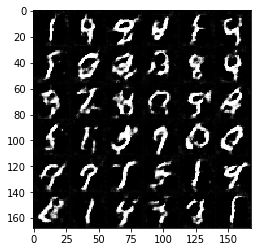

Epoch 1/2... Discriminator Loss: 1.3234... Generator Loss: 0.6513
Epoch 1/2... Discriminator Loss: 1.2214... Generator Loss: 1.0196
Epoch 1/2... Discriminator Loss: 1.0902... Generator Loss: 1.3481
Epoch 1/2... Discriminator Loss: 1.4648... Generator Loss: 0.4377
Epoch 1/2... Discriminator Loss: 1.3980... Generator Loss: 0.3584
Epoch 1/2... Discriminator Loss: 1.1625... Generator Loss: 0.9638
Epoch 1/2... Discriminator Loss: 1.2291... Generator Loss: 1.1734
Epoch 1/2... Discriminator Loss: 1.0313... Generator Loss: 0.6404
Epoch 1/2... Discriminator Loss: 1.4140... Generator Loss: 0.3768
Epoch 1/2... Discriminator Loss: 1.3421... Generator Loss: 0.4448


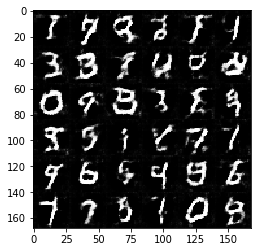

Epoch 1/2... Discriminator Loss: 1.4120... Generator Loss: 0.3688
Epoch 1/2... Discriminator Loss: 1.1388... Generator Loss: 0.6250
Epoch 1/2... Discriminator Loss: 1.3271... Generator Loss: 1.3834
Epoch 1/2... Discriminator Loss: 1.9039... Generator Loss: 0.1945
Epoch 1/2... Discriminator Loss: 1.4383... Generator Loss: 0.3536
Epoch 1/2... Discriminator Loss: 1.0312... Generator Loss: 1.1262
Epoch 1/2... Discriminator Loss: 1.2449... Generator Loss: 0.6946
Epoch 1/2... Discriminator Loss: 1.0543... Generator Loss: 0.8842
Epoch 1/2... Discriminator Loss: 1.3427... Generator Loss: 1.2106
Epoch 1/2... Discriminator Loss: 1.7561... Generator Loss: 0.2126


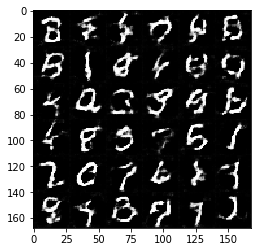

Epoch 1/2... Discriminator Loss: 1.3468... Generator Loss: 0.8107
Epoch 1/2... Discriminator Loss: 1.2242... Generator Loss: 0.6331
Epoch 1/2... Discriminator Loss: 0.9372... Generator Loss: 0.9539
Epoch 1/2... Discriminator Loss: 1.3701... Generator Loss: 0.4784
Epoch 1/2... Discriminator Loss: 1.3411... Generator Loss: 0.3696
Epoch 1/2... Discriminator Loss: 1.5466... Generator Loss: 0.3052
Epoch 1/2... Discriminator Loss: 1.0871... Generator Loss: 0.9344
Epoch 1/2... Discriminator Loss: 1.2101... Generator Loss: 1.3638
Epoch 1/2... Discriminator Loss: 1.0333... Generator Loss: 0.6471
Epoch 1/2... Discriminator Loss: 1.5972... Generator Loss: 0.2545


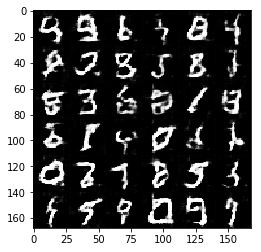

Epoch 1/2... Discriminator Loss: 1.2573... Generator Loss: 0.6370
Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 1.1833
Epoch 1/2... Discriminator Loss: 1.2585... Generator Loss: 0.3987
Epoch 1/2... Discriminator Loss: 0.9918... Generator Loss: 0.9165
Epoch 1/2... Discriminator Loss: 1.0750... Generator Loss: 0.6790
Epoch 1/2... Discriminator Loss: 1.9904... Generator Loss: 0.1662
Epoch 1/2... Discriminator Loss: 1.4206... Generator Loss: 0.3621
Epoch 1/2... Discriminator Loss: 1.1132... Generator Loss: 1.2002
Epoch 1/2... Discriminator Loss: 0.9327... Generator Loss: 1.0406
Epoch 1/2... Discriminator Loss: 1.1536... Generator Loss: 0.7759


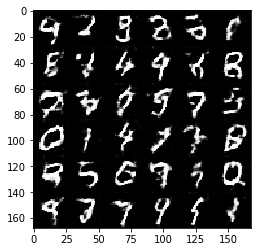

Epoch 1/2... Discriminator Loss: 1.1612... Generator Loss: 1.1456
Epoch 1/2... Discriminator Loss: 1.0819... Generator Loss: 1.1962
Epoch 1/2... Discriminator Loss: 0.9634... Generator Loss: 1.5564
Epoch 1/2... Discriminator Loss: 1.1796... Generator Loss: 0.5044
Epoch 1/2... Discriminator Loss: 1.2136... Generator Loss: 0.4683
Epoch 1/2... Discriminator Loss: 1.4678... Generator Loss: 0.3396
Epoch 1/2... Discriminator Loss: 1.1093... Generator Loss: 0.5697
Epoch 1/2... Discriminator Loss: 1.1609... Generator Loss: 0.6727
Epoch 1/2... Discriminator Loss: 1.3049... Generator Loss: 0.3819
Epoch 1/2... Discriminator Loss: 1.4859... Generator Loss: 0.3086


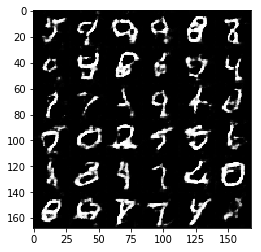

Epoch 1/2... Discriminator Loss: 1.0256... Generator Loss: 0.9067
Epoch 1/2... Discriminator Loss: 1.1043... Generator Loss: 1.5242
Epoch 1/2... Discriminator Loss: 1.7989... Generator Loss: 0.2137
Epoch 1/2... Discriminator Loss: 1.1508... Generator Loss: 0.5638
Epoch 1/2... Discriminator Loss: 1.2924... Generator Loss: 0.4394
Epoch 1/2... Discriminator Loss: 1.4707... Generator Loss: 0.3174
Epoch 1/2... Discriminator Loss: 1.1491... Generator Loss: 1.6661
Epoch 1/2... Discriminator Loss: 1.0045... Generator Loss: 0.9939
Epoch 1/2... Discriminator Loss: 1.0586... Generator Loss: 0.6700
Epoch 1/2... Discriminator Loss: 1.5726... Generator Loss: 0.2877


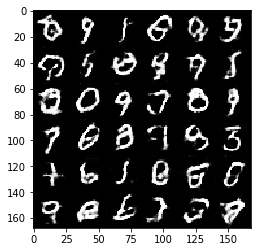

Epoch 1/2... Discriminator Loss: 1.9338... Generator Loss: 0.1760
Epoch 1/2... Discriminator Loss: 1.0196... Generator Loss: 0.5727
Epoch 1/2... Discriminator Loss: 0.8915... Generator Loss: 1.2640
Epoch 1/2... Discriminator Loss: 0.9854... Generator Loss: 0.7512
Epoch 1/2... Discriminator Loss: 0.9432... Generator Loss: 1.1249
Epoch 1/2... Discriminator Loss: 1.2569... Generator Loss: 0.4888
Epoch 1/2... Discriminator Loss: 1.1711... Generator Loss: 0.5734
Epoch 1/2... Discriminator Loss: 1.1047... Generator Loss: 1.0244
Epoch 1/2... Discriminator Loss: 1.0271... Generator Loss: 0.7748
Epoch 1/2... Discriminator Loss: 1.1025... Generator Loss: 0.6420


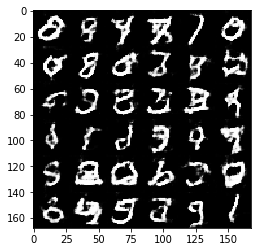

Epoch 1/2... Discriminator Loss: 1.0337... Generator Loss: 0.6136
Epoch 1/2... Discriminator Loss: 1.4363... Generator Loss: 0.3382
Epoch 1/2... Discriminator Loss: 0.9420... Generator Loss: 0.8358
Epoch 1/2... Discriminator Loss: 0.8667... Generator Loss: 1.0539
Epoch 1/2... Discriminator Loss: 1.1535... Generator Loss: 0.6904
Epoch 1/2... Discriminator Loss: 0.6969... Generator Loss: 1.3521
Epoch 1/2... Discriminator Loss: 2.0483... Generator Loss: 0.1443
Epoch 1/2... Discriminator Loss: 1.4528... Generator Loss: 0.2992
Epoch 1/2... Discriminator Loss: 1.2794... Generator Loss: 0.4644
Epoch 1/2... Discriminator Loss: 0.9593... Generator Loss: 1.0514


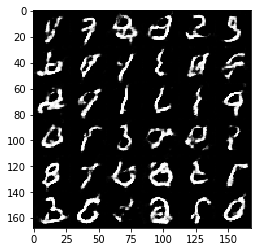

Epoch 1/2... Discriminator Loss: 1.7471... Generator Loss: 0.2120
Epoch 1/2... Discriminator Loss: 1.4021... Generator Loss: 0.3291
Epoch 1/2... Discriminator Loss: 0.6863... Generator Loss: 1.6855
Epoch 1/2... Discriminator Loss: 1.6104... Generator Loss: 0.2549
Epoch 1/2... Discriminator Loss: 1.2367... Generator Loss: 0.6624
Epoch 1/2... Discriminator Loss: 1.0072... Generator Loss: 1.0280
Epoch 1/2... Discriminator Loss: 1.6762... Generator Loss: 0.2434
Epoch 1/2... Discriminator Loss: 0.7798... Generator Loss: 0.7274
Epoch 1/2... Discriminator Loss: 1.1335... Generator Loss: 0.5975
Epoch 1/2... Discriminator Loss: 0.8495... Generator Loss: 1.6080


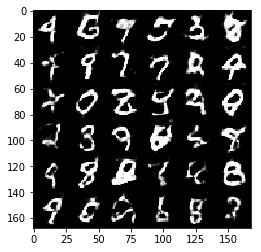

Epoch 1/2... Discriminator Loss: 1.0712... Generator Loss: 0.7575
Epoch 1/2... Discriminator Loss: 0.8022... Generator Loss: 1.0079
Epoch 1/2... Discriminator Loss: 1.0768... Generator Loss: 1.3175
Epoch 1/2... Discriminator Loss: 1.3806... Generator Loss: 0.3637
Epoch 1/2... Discriminator Loss: 0.9938... Generator Loss: 1.0502
Epoch 1/2... Discriminator Loss: 1.6074... Generator Loss: 0.2817
Epoch 1/2... Discriminator Loss: 1.3573... Generator Loss: 0.3389
Epoch 2/2... Discriminator Loss: 1.0237... Generator Loss: 1.8088
Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 0.5929
Epoch 2/2... Discriminator Loss: 1.0154... Generator Loss: 0.7895


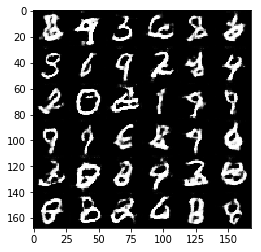

Epoch 2/2... Discriminator Loss: 0.8497... Generator Loss: 0.8789
Epoch 2/2... Discriminator Loss: 2.2173... Generator Loss: 2.4749
Epoch 2/2... Discriminator Loss: 1.1754... Generator Loss: 0.5380
Epoch 2/2... Discriminator Loss: 0.8354... Generator Loss: 0.8205
Epoch 2/2... Discriminator Loss: 1.0795... Generator Loss: 0.5258
Epoch 2/2... Discriminator Loss: 1.2016... Generator Loss: 0.4314
Epoch 2/2... Discriminator Loss: 3.7571... Generator Loss: 0.0299
Epoch 2/2... Discriminator Loss: 0.8983... Generator Loss: 0.9753
Epoch 2/2... Discriminator Loss: 1.5315... Generator Loss: 0.2808
Epoch 2/2... Discriminator Loss: 0.8981... Generator Loss: 0.7633


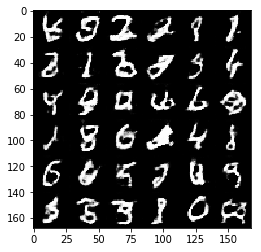

Epoch 2/2... Discriminator Loss: 0.9596... Generator Loss: 0.6315
Epoch 2/2... Discriminator Loss: 1.3196... Generator Loss: 0.4007
Epoch 2/2... Discriminator Loss: 1.7472... Generator Loss: 0.3019
Epoch 2/2... Discriminator Loss: 1.7749... Generator Loss: 0.2222
Epoch 2/2... Discriminator Loss: 2.4787... Generator Loss: 0.1008
Epoch 2/2... Discriminator Loss: 1.2079... Generator Loss: 0.4178
Epoch 2/2... Discriminator Loss: 0.9178... Generator Loss: 0.8532
Epoch 2/2... Discriminator Loss: 0.7821... Generator Loss: 0.9005
Epoch 2/2... Discriminator Loss: 1.5955... Generator Loss: 0.2558
Epoch 2/2... Discriminator Loss: 1.2275... Generator Loss: 0.4245


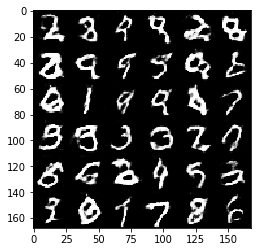

Epoch 2/2... Discriminator Loss: 0.8590... Generator Loss: 1.3137
Epoch 2/2... Discriminator Loss: 1.0351... Generator Loss: 1.6254
Epoch 2/2... Discriminator Loss: 1.0218... Generator Loss: 0.8850
Epoch 2/2... Discriminator Loss: 1.5732... Generator Loss: 0.2647
Epoch 2/2... Discriminator Loss: 1.3389... Generator Loss: 0.3245
Epoch 2/2... Discriminator Loss: 0.9628... Generator Loss: 0.9115
Epoch 2/2... Discriminator Loss: 0.9373... Generator Loss: 0.7277
Epoch 2/2... Discriminator Loss: 0.7881... Generator Loss: 1.0337
Epoch 2/2... Discriminator Loss: 0.9858... Generator Loss: 0.9340
Epoch 2/2... Discriminator Loss: 1.3952... Generator Loss: 0.3672


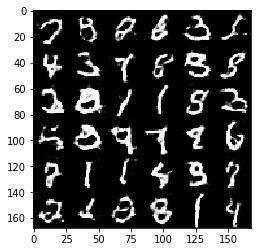

Epoch 2/2... Discriminator Loss: 0.9201... Generator Loss: 1.1518
Epoch 2/2... Discriminator Loss: 0.7652... Generator Loss: 1.1448
Epoch 2/2... Discriminator Loss: 1.4136... Generator Loss: 0.3190
Epoch 2/2... Discriminator Loss: 1.0814... Generator Loss: 2.1998
Epoch 2/2... Discriminator Loss: 1.2522... Generator Loss: 0.4216
Epoch 2/2... Discriminator Loss: 0.6527... Generator Loss: 1.0310
Epoch 2/2... Discriminator Loss: 1.7717... Generator Loss: 0.2159
Epoch 2/2... Discriminator Loss: 1.3587... Generator Loss: 0.4090
Epoch 2/2... Discriminator Loss: 0.7715... Generator Loss: 0.9231
Epoch 2/2... Discriminator Loss: 1.0117... Generator Loss: 1.0245


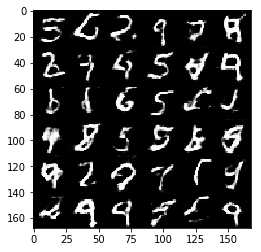

Epoch 2/2... Discriminator Loss: 1.0204... Generator Loss: 0.5598
Epoch 2/2... Discriminator Loss: 1.5497... Generator Loss: 0.2756
Epoch 2/2... Discriminator Loss: 1.5009... Generator Loss: 0.2775
Epoch 2/2... Discriminator Loss: 1.0544... Generator Loss: 0.5030
Epoch 2/2... Discriminator Loss: 1.0085... Generator Loss: 0.6158
Epoch 2/2... Discriminator Loss: 1.1622... Generator Loss: 0.4904
Epoch 2/2... Discriminator Loss: 0.8387... Generator Loss: 0.9877
Epoch 2/2... Discriminator Loss: 1.7131... Generator Loss: 0.2183
Epoch 2/2... Discriminator Loss: 1.4007... Generator Loss: 0.3521
Epoch 2/2... Discriminator Loss: 1.8946... Generator Loss: 0.1776


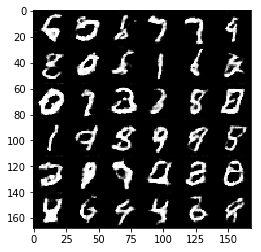

Epoch 2/2... Discriminator Loss: 0.7995... Generator Loss: 1.3472
Epoch 2/2... Discriminator Loss: 1.2037... Generator Loss: 0.4274
Epoch 2/2... Discriminator Loss: 0.9925... Generator Loss: 0.6779
Epoch 2/2... Discriminator Loss: 1.1466... Generator Loss: 0.5482
Epoch 2/2... Discriminator Loss: 1.1769... Generator Loss: 0.4408
Epoch 2/2... Discriminator Loss: 0.6131... Generator Loss: 1.2694
Epoch 2/2... Discriminator Loss: 1.0961... Generator Loss: 0.5439
Epoch 2/2... Discriminator Loss: 0.7956... Generator Loss: 0.8821
Epoch 2/2... Discriminator Loss: 1.0049... Generator Loss: 0.5694
Epoch 2/2... Discriminator Loss: 0.8492... Generator Loss: 1.0094


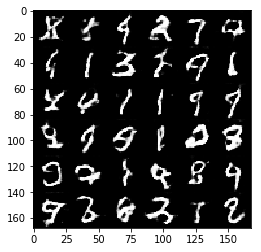

Epoch 2/2... Discriminator Loss: 1.8800... Generator Loss: 3.2936
Epoch 2/2... Discriminator Loss: 1.2268... Generator Loss: 1.1278
Epoch 2/2... Discriminator Loss: 1.2015... Generator Loss: 0.4718
Epoch 2/2... Discriminator Loss: 1.0556... Generator Loss: 0.6632
Epoch 2/2... Discriminator Loss: 1.4721... Generator Loss: 0.3073
Epoch 2/2... Discriminator Loss: 1.6740... Generator Loss: 0.2447
Epoch 2/2... Discriminator Loss: 0.6795... Generator Loss: 1.0817
Epoch 2/2... Discriminator Loss: 2.0012... Generator Loss: 0.1581
Epoch 2/2... Discriminator Loss: 1.4970... Generator Loss: 0.2937
Epoch 2/2... Discriminator Loss: 2.1722... Generator Loss: 0.1446


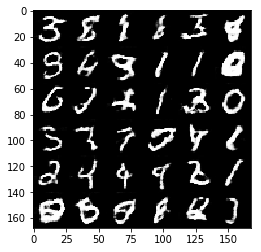

Epoch 2/2... Discriminator Loss: 3.0264... Generator Loss: 0.0604
Epoch 2/2... Discriminator Loss: 0.9921... Generator Loss: 0.6587
Epoch 2/2... Discriminator Loss: 0.8231... Generator Loss: 1.0024
Epoch 2/2... Discriminator Loss: 0.8552... Generator Loss: 1.4824
Epoch 2/2... Discriminator Loss: 0.7549... Generator Loss: 1.1047
Epoch 2/2... Discriminator Loss: 0.9417... Generator Loss: 0.7256
Epoch 2/2... Discriminator Loss: 1.4810... Generator Loss: 0.2978
Epoch 2/2... Discriminator Loss: 2.2634... Generator Loss: 0.1160
Epoch 2/2... Discriminator Loss: 0.5359... Generator Loss: 1.3240
Epoch 2/2... Discriminator Loss: 1.8301... Generator Loss: 0.1912


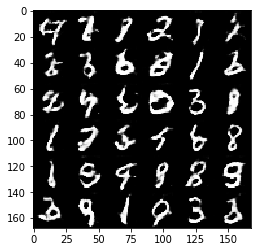

Epoch 2/2... Discriminator Loss: 0.8824... Generator Loss: 1.3243
Epoch 2/2... Discriminator Loss: 0.8278... Generator Loss: 0.7922
Epoch 2/2... Discriminator Loss: 0.9173... Generator Loss: 0.6197
Epoch 2/2... Discriminator Loss: 0.5694... Generator Loss: 1.6705
Epoch 2/2... Discriminator Loss: 0.9470... Generator Loss: 0.6130
Epoch 2/2... Discriminator Loss: 2.1694... Generator Loss: 0.1297
Epoch 2/2... Discriminator Loss: 1.5991... Generator Loss: 0.2570
Epoch 2/2... Discriminator Loss: 0.8297... Generator Loss: 0.7072
Epoch 2/2... Discriminator Loss: 1.0120... Generator Loss: 2.5720
Epoch 2/2... Discriminator Loss: 0.9908... Generator Loss: 0.6332


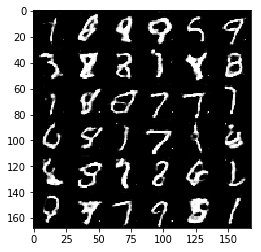

Epoch 2/2... Discriminator Loss: 0.9462... Generator Loss: 1.4639
Epoch 2/2... Discriminator Loss: 1.0178... Generator Loss: 1.5567
Epoch 2/2... Discriminator Loss: 0.7926... Generator Loss: 0.8285
Epoch 2/2... Discriminator Loss: 0.8151... Generator Loss: 0.8406
Epoch 2/2... Discriminator Loss: 0.7324... Generator Loss: 1.0015
Epoch 2/2... Discriminator Loss: 0.5938... Generator Loss: 1.0806
Epoch 2/2... Discriminator Loss: 0.7138... Generator Loss: 1.8589
Epoch 2/2... Discriminator Loss: 0.8303... Generator Loss: 0.8457
Epoch 2/2... Discriminator Loss: 0.7239... Generator Loss: 1.0152
Epoch 2/2... Discriminator Loss: 1.0482... Generator Loss: 0.5342


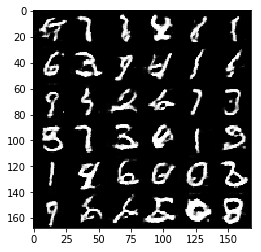

Epoch 2/2... Discriminator Loss: 1.9125... Generator Loss: 0.1700
Epoch 2/2... Discriminator Loss: 0.6304... Generator Loss: 1.1600
Epoch 2/2... Discriminator Loss: 0.7939... Generator Loss: 1.6370
Epoch 2/2... Discriminator Loss: 1.0666... Generator Loss: 0.5525
Epoch 2/2... Discriminator Loss: 1.4939... Generator Loss: 0.3267
Epoch 2/2... Discriminator Loss: 1.2094... Generator Loss: 0.4639
Epoch 2/2... Discriminator Loss: 0.7258... Generator Loss: 0.9081
Epoch 2/2... Discriminator Loss: 2.2931... Generator Loss: 0.1326
Epoch 2/2... Discriminator Loss: 1.6764... Generator Loss: 0.2450
Epoch 2/2... Discriminator Loss: 0.8849... Generator Loss: 0.6776


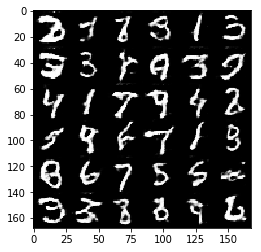

Epoch 2/2... Discriminator Loss: 0.8629... Generator Loss: 1.2185
Epoch 2/2... Discriminator Loss: 0.7965... Generator Loss: 0.8767
Epoch 2/2... Discriminator Loss: 0.9890... Generator Loss: 2.8854
Epoch 2/2... Discriminator Loss: 0.8616... Generator Loss: 0.6997
Epoch 2/2... Discriminator Loss: 1.4201... Generator Loss: 0.3819
Epoch 2/2... Discriminator Loss: 0.8545... Generator Loss: 0.8285
Epoch 2/2... Discriminator Loss: 0.5886... Generator Loss: 1.2446
Epoch 2/2... Discriminator Loss: 0.7927... Generator Loss: 1.0231
Epoch 2/2... Discriminator Loss: 0.6234... Generator Loss: 1.8065
Epoch 2/2... Discriminator Loss: 0.8319... Generator Loss: 0.7753


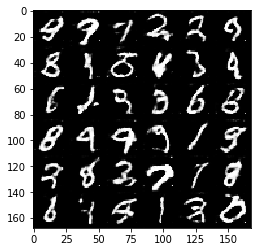

Epoch 2/2... Discriminator Loss: 1.3358... Generator Loss: 0.3928
Epoch 2/2... Discriminator Loss: 0.7144... Generator Loss: 1.0511
Epoch 2/2... Discriminator Loss: 1.3449... Generator Loss: 0.4035
Epoch 2/2... Discriminator Loss: 1.5555... Generator Loss: 0.3218
Epoch 2/2... Discriminator Loss: 0.8534... Generator Loss: 0.6548
Epoch 2/2... Discriminator Loss: 0.8722... Generator Loss: 0.9870
Epoch 2/2... Discriminator Loss: 1.7827... Generator Loss: 0.2085
Epoch 2/2... Discriminator Loss: 0.9860... Generator Loss: 0.5524
Epoch 2/2... Discriminator Loss: 0.9882... Generator Loss: 0.5618
Epoch 2/2... Discriminator Loss: 0.4800... Generator Loss: 1.2843


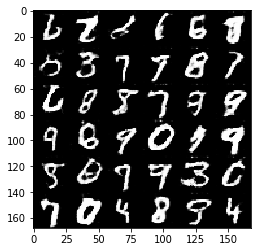

Epoch 2/2... Discriminator Loss: 1.6066... Generator Loss: 2.7360
Epoch 2/2... Discriminator Loss: 1.2299... Generator Loss: 2.4547
Epoch 2/2... Discriminator Loss: 0.8135... Generator Loss: 1.5152
Epoch 2/2... Discriminator Loss: 0.7463... Generator Loss: 0.9216
Epoch 2/2... Discriminator Loss: 0.7586... Generator Loss: 0.8020
Epoch 2/2... Discriminator Loss: 0.5615... Generator Loss: 1.3169
Epoch 2/2... Discriminator Loss: 1.4924... Generator Loss: 0.3259
Epoch 2/2... Discriminator Loss: 1.5397... Generator Loss: 2.4357
Epoch 2/2... Discriminator Loss: 0.8839... Generator Loss: 0.7551
Epoch 2/2... Discriminator Loss: 1.0123... Generator Loss: 0.5934


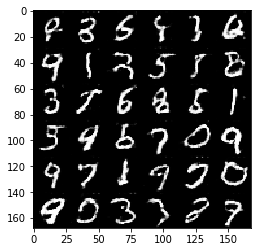

Epoch 2/2... Discriminator Loss: 0.7968... Generator Loss: 0.7377
Epoch 2/2... Discriminator Loss: 1.0443... Generator Loss: 0.5098
Epoch 2/2... Discriminator Loss: 0.5841... Generator Loss: 1.2838
Epoch 2/2... Discriminator Loss: 2.0997... Generator Loss: 0.1534
Epoch 2/2... Discriminator Loss: 1.1817... Generator Loss: 0.4755
Epoch 2/2... Discriminator Loss: 0.9560... Generator Loss: 0.7610
Epoch 2/2... Discriminator Loss: 1.0605... Generator Loss: 0.5914
Epoch 2/2... Discriminator Loss: 1.1836... Generator Loss: 0.4643
Epoch 2/2... Discriminator Loss: 0.8019... Generator Loss: 0.7713
Epoch 2/2... Discriminator Loss: 2.8186... Generator Loss: 0.0763


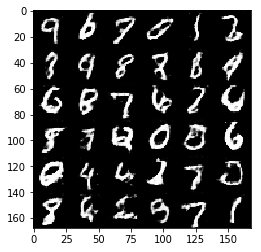

Epoch 2/2... Discriminator Loss: 0.5568... Generator Loss: 1.0436
Epoch 2/2... Discriminator Loss: 0.6915... Generator Loss: 1.6938
Epoch 2/2... Discriminator Loss: 0.5982... Generator Loss: 1.0179
Epoch 2/2... Discriminator Loss: 0.9541... Generator Loss: 3.1976
Epoch 2/2... Discriminator Loss: 0.9421... Generator Loss: 0.9520
Epoch 2/2... Discriminator Loss: 1.7643... Generator Loss: 0.2211
Epoch 2/2... Discriminator Loss: 0.5980... Generator Loss: 1.0329
Epoch 2/2... Discriminator Loss: 0.5493... Generator Loss: 1.1525
Epoch 2/2... Discriminator Loss: 0.4558... Generator Loss: 1.7033
Epoch 2/2... Discriminator Loss: 0.8023... Generator Loss: 2.1513


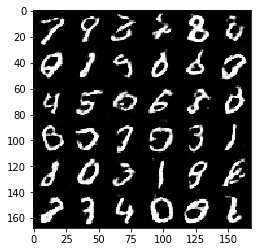

Epoch 2/2... Discriminator Loss: 0.8855... Generator Loss: 0.8552
Epoch 2/2... Discriminator Loss: 1.0122... Generator Loss: 0.6431
Epoch 2/2... Discriminator Loss: 0.4911... Generator Loss: 1.3739
Epoch 2/2... Discriminator Loss: 0.8868... Generator Loss: 0.6285
Epoch 2/2... Discriminator Loss: 0.7718... Generator Loss: 0.8306
Epoch 2/2... Discriminator Loss: 0.6102... Generator Loss: 1.6187
Epoch 2/2... Discriminator Loss: 0.5677... Generator Loss: 1.2212
Epoch 2/2... Discriminator Loss: 0.6166... Generator Loss: 1.2534
Epoch 2/2... Discriminator Loss: 0.8699... Generator Loss: 0.7618
Epoch 2/2... Discriminator Loss: 1.4463... Generator Loss: 0.3205


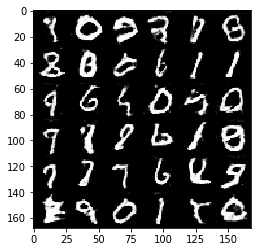

Epoch 2/2... Discriminator Loss: 1.5732... Generator Loss: 0.2696
Epoch 2/2... Discriminator Loss: 0.8601... Generator Loss: 0.6620
Epoch 2/2... Discriminator Loss: 0.7372... Generator Loss: 1.0322
Epoch 2/2... Discriminator Loss: 1.5237... Generator Loss: 0.3291
Epoch 2/2... Discriminator Loss: 1.0941... Generator Loss: 0.4553
Epoch 2/2... Discriminator Loss: 0.5029... Generator Loss: 2.0313
Epoch 2/2... Discriminator Loss: 0.8434... Generator Loss: 0.7337
Epoch 2/2... Discriminator Loss: 0.4807... Generator Loss: 1.4582
Epoch 2/2... Discriminator Loss: 0.6841... Generator Loss: 1.0308
Epoch 2/2... Discriminator Loss: 0.9205... Generator Loss: 0.7429


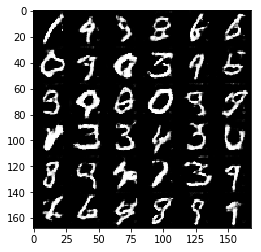

Epoch 2/2... Discriminator Loss: 0.6043... Generator Loss: 1.2497
Epoch 2/2... Discriminator Loss: 0.4825... Generator Loss: 1.8108
Epoch 2/2... Discriminator Loss: 0.4713... Generator Loss: 2.4064
Epoch 2/2... Discriminator Loss: 0.5429... Generator Loss: 1.2085
Epoch 2/2... Discriminator Loss: 0.6813... Generator Loss: 1.5447


In [12]:
# Use same hyperparamters as DCGAN, appears to be effective

batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2
n_images = 36

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 11.3150... Generator Loss: 0.0000
Epoch 1/2... Discriminator Loss: 6.3597... Generator Loss: 0.0024
Epoch 1/2... Discriminator Loss: 5.6534... Generator Loss: 0.0054
Epoch 1/2... Discriminator Loss: 4.3323... Generator Loss: 0.0218
Epoch 1/2... Discriminator Loss: 3.4240... Generator Loss: 0.0490
Epoch 1/2... Discriminator Loss: 2.7748... Generator Loss: 0.1090
Epoch 1/2... Discriminator Loss: 2.2546... Generator Loss: 0.1949
Epoch 1/2... Discriminator Loss: 1.8792... Generator Loss: 0.2441
Epoch 1/2... Discriminator Loss: 1.8945... Generator Loss: 0.2863
Epoch 1/2... Discriminator Loss: 1.4906... Generator Loss: 0.3496


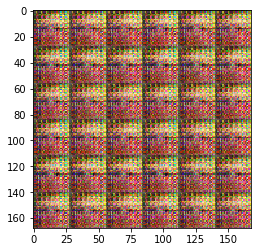

Epoch 1/2... Discriminator Loss: 1.5702... Generator Loss: 0.3389
Epoch 1/2... Discriminator Loss: 1.8409... Generator Loss: 0.2092
Epoch 1/2... Discriminator Loss: 1.0957... Generator Loss: 0.4848
Epoch 1/2... Discriminator Loss: 0.8191... Generator Loss: 0.8816
Epoch 1/2... Discriminator Loss: 1.0240... Generator Loss: 0.7670
Epoch 1/2... Discriminator Loss: 1.0179... Generator Loss: 0.6032
Epoch 1/2... Discriminator Loss: 0.5064... Generator Loss: 3.4136
Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 0.8429
Epoch 1/2... Discriminator Loss: 0.8434... Generator Loss: 1.1180
Epoch 1/2... Discriminator Loss: 1.1139... Generator Loss: 0.5804


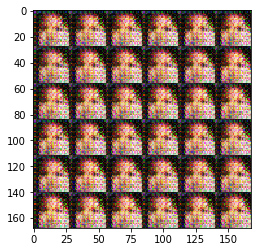

Epoch 1/2... Discriminator Loss: 0.4923... Generator Loss: 1.2818
Epoch 1/2... Discriminator Loss: 0.5679... Generator Loss: 1.3288
Epoch 1/2... Discriminator Loss: 1.2627... Generator Loss: 0.4812
Epoch 1/2... Discriminator Loss: 0.6784... Generator Loss: 0.9344
Epoch 1/2... Discriminator Loss: 0.4168... Generator Loss: 2.1329
Epoch 1/2... Discriminator Loss: 0.3150... Generator Loss: 2.1060
Epoch 1/2... Discriminator Loss: 0.3056... Generator Loss: 1.6548
Epoch 1/2... Discriminator Loss: 0.5166... Generator Loss: 1.0597
Epoch 1/2... Discriminator Loss: 0.6451... Generator Loss: 0.8186
Epoch 1/2... Discriminator Loss: 0.3621... Generator Loss: 1.9592


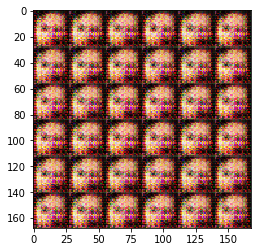

Epoch 1/2... Discriminator Loss: 0.1401... Generator Loss: 4.7246
Epoch 1/2... Discriminator Loss: 0.5829... Generator Loss: 1.4066
Epoch 1/2... Discriminator Loss: 0.3115... Generator Loss: 1.7482
Epoch 1/2... Discriminator Loss: 0.2222... Generator Loss: 2.3653
Epoch 1/2... Discriminator Loss: 0.1676... Generator Loss: 2.2166
Epoch 1/2... Discriminator Loss: 0.3010... Generator Loss: 1.7775
Epoch 1/2... Discriminator Loss: 0.4113... Generator Loss: 1.3990
Epoch 1/2... Discriminator Loss: 0.3108... Generator Loss: 2.2163
Epoch 1/2... Discriminator Loss: 0.0970... Generator Loss: 3.1157
Epoch 1/2... Discriminator Loss: 0.7359... Generator Loss: 0.7225


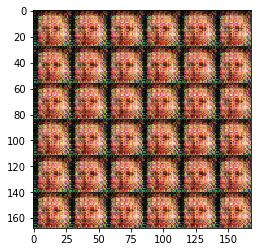

Epoch 1/2... Discriminator Loss: 0.1938... Generator Loss: 2.2556
Epoch 1/2... Discriminator Loss: 0.2971... Generator Loss: 1.8482
Epoch 1/2... Discriminator Loss: 0.4055... Generator Loss: 1.3635
Epoch 1/2... Discriminator Loss: 0.0855... Generator Loss: 2.7705
Epoch 1/2... Discriminator Loss: 0.1231... Generator Loss: 2.9042
Epoch 1/2... Discriminator Loss: 0.4048... Generator Loss: 1.3493
Epoch 1/2... Discriminator Loss: 0.4342... Generator Loss: 1.4170
Epoch 1/2... Discriminator Loss: 0.2876... Generator Loss: 1.7677
Epoch 1/2... Discriminator Loss: 0.1441... Generator Loss: 2.4892
Epoch 1/2... Discriminator Loss: 0.2585... Generator Loss: 3.0749


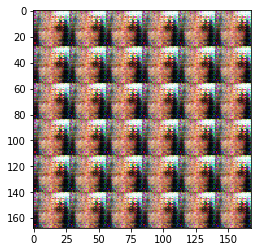

Epoch 1/2... Discriminator Loss: 0.1366... Generator Loss: 2.4176
Epoch 1/2... Discriminator Loss: 0.4898... Generator Loss: 1.4120
Epoch 1/2... Discriminator Loss: 0.1802... Generator Loss: 3.8081
Epoch 1/2... Discriminator Loss: 0.1376... Generator Loss: 2.4293
Epoch 1/2... Discriminator Loss: 0.1082... Generator Loss: 2.8514
Epoch 1/2... Discriminator Loss: 0.1679... Generator Loss: 2.4574
Epoch 1/2... Discriminator Loss: 0.0880... Generator Loss: 3.0272
Epoch 1/2... Discriminator Loss: 0.0747... Generator Loss: 3.0974
Epoch 1/2... Discriminator Loss: 0.1188... Generator Loss: 3.3728
Epoch 1/2... Discriminator Loss: 0.0772... Generator Loss: 2.9663


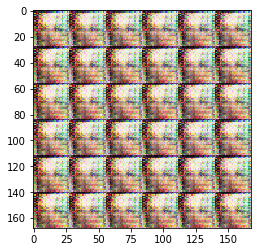

Epoch 1/2... Discriminator Loss: 0.1130... Generator Loss: 2.3237
Epoch 1/2... Discriminator Loss: 0.2782... Generator Loss: 1.7281
Epoch 1/2... Discriminator Loss: 0.0843... Generator Loss: 3.4721
Epoch 1/2... Discriminator Loss: 0.0660... Generator Loss: 3.3591
Epoch 1/2... Discriminator Loss: 0.0783... Generator Loss: 2.7129
Epoch 1/2... Discriminator Loss: 0.0859... Generator Loss: 2.7286
Epoch 1/2... Discriminator Loss: 0.0698... Generator Loss: 3.3179
Epoch 1/2... Discriminator Loss: 0.0953... Generator Loss: 2.4530
Epoch 1/2... Discriminator Loss: 0.1636... Generator Loss: 2.2718
Epoch 1/2... Discriminator Loss: 0.0692... Generator Loss: 3.1915


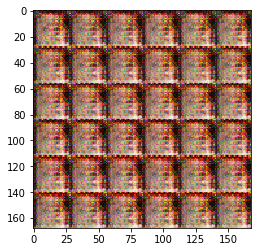

Epoch 1/2... Discriminator Loss: 0.5599... Generator Loss: 0.8957
Epoch 1/2... Discriminator Loss: 0.2652... Generator Loss: 1.6316
Epoch 1/2... Discriminator Loss: 0.0830... Generator Loss: 3.0592
Epoch 1/2... Discriminator Loss: 0.0907... Generator Loss: 2.8895
Epoch 1/2... Discriminator Loss: 0.0657... Generator Loss: 3.7213
Epoch 1/2... Discriminator Loss: 0.0913... Generator Loss: 3.1832
Epoch 1/2... Discriminator Loss: 0.0855... Generator Loss: 3.0871
Epoch 1/2... Discriminator Loss: 1.2734... Generator Loss: 0.3691
Epoch 1/2... Discriminator Loss: 0.1589... Generator Loss: 2.0138
Epoch 1/2... Discriminator Loss: 3.4872... Generator Loss: 0.0391


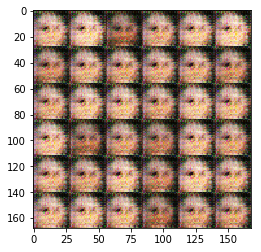

Epoch 1/2... Discriminator Loss: 1.9485... Generator Loss: 0.2914
Epoch 1/2... Discriminator Loss: 1.1650... Generator Loss: 0.6199
Epoch 1/2... Discriminator Loss: 1.4617... Generator Loss: 0.3525
Epoch 1/2... Discriminator Loss: 1.0857... Generator Loss: 0.5692
Epoch 1/2... Discriminator Loss: 1.3093... Generator Loss: 0.7001
Epoch 1/2... Discriminator Loss: 1.1093... Generator Loss: 0.6496
Epoch 1/2... Discriminator Loss: 1.6219... Generator Loss: 0.3624
Epoch 1/2... Discriminator Loss: 0.9199... Generator Loss: 0.8380
Epoch 1/2... Discriminator Loss: 1.0880... Generator Loss: 0.6586
Epoch 1/2... Discriminator Loss: 0.9212... Generator Loss: 0.8313


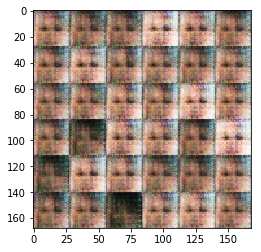

Epoch 1/2... Discriminator Loss: 1.6433... Generator Loss: 0.3222
Epoch 1/2... Discriminator Loss: 1.0001... Generator Loss: 0.8107
Epoch 1/2... Discriminator Loss: 1.6709... Generator Loss: 0.4438
Epoch 1/2... Discriminator Loss: 0.7451... Generator Loss: 0.9719
Epoch 1/2... Discriminator Loss: 0.4312... Generator Loss: 1.4133
Epoch 1/2... Discriminator Loss: 1.9537... Generator Loss: 0.2134
Epoch 1/2... Discriminator Loss: 0.9916... Generator Loss: 0.8079
Epoch 1/2... Discriminator Loss: 1.8574... Generator Loss: 0.3907
Epoch 1/2... Discriminator Loss: 1.0466... Generator Loss: 1.3183
Epoch 1/2... Discriminator Loss: 1.3131... Generator Loss: 0.4717


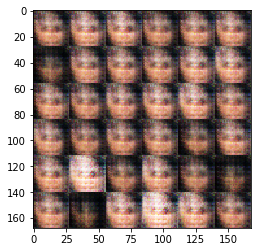

Epoch 1/2... Discriminator Loss: 0.7141... Generator Loss: 1.9352
Epoch 1/2... Discriminator Loss: 1.3011... Generator Loss: 0.4510
Epoch 1/2... Discriminator Loss: 1.2888... Generator Loss: 0.4955
Epoch 1/2... Discriminator Loss: 1.1133... Generator Loss: 0.5830
Epoch 1/2... Discriminator Loss: 0.7835... Generator Loss: 0.9976
Epoch 1/2... Discriminator Loss: 1.3134... Generator Loss: 1.3282
Epoch 1/2... Discriminator Loss: 0.6961... Generator Loss: 1.2077
Epoch 1/2... Discriminator Loss: 0.8350... Generator Loss: 1.0884
Epoch 1/2... Discriminator Loss: 1.1546... Generator Loss: 0.5981
Epoch 1/2... Discriminator Loss: 1.0521... Generator Loss: 0.6479


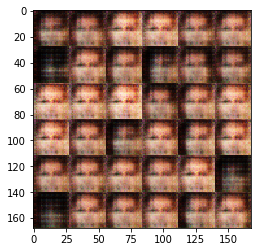

Epoch 1/2... Discriminator Loss: 0.7879... Generator Loss: 0.8208
Epoch 1/2... Discriminator Loss: 1.4051... Generator Loss: 1.9488
Epoch 1/2... Discriminator Loss: 0.6837... Generator Loss: 0.9790
Epoch 1/2... Discriminator Loss: 2.0166... Generator Loss: 0.2358
Epoch 1/2... Discriminator Loss: 1.0782... Generator Loss: 0.5509
Epoch 1/2... Discriminator Loss: 0.9181... Generator Loss: 0.8880
Epoch 1/2... Discriminator Loss: 1.3253... Generator Loss: 0.7797
Epoch 1/2... Discriminator Loss: 0.9159... Generator Loss: 0.7593
Epoch 1/2... Discriminator Loss: 1.1274... Generator Loss: 1.3373
Epoch 1/2... Discriminator Loss: 1.6460... Generator Loss: 0.3216


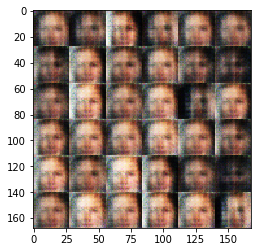

Epoch 1/2... Discriminator Loss: 1.4162... Generator Loss: 0.5915
Epoch 1/2... Discriminator Loss: 1.4376... Generator Loss: 0.4558
Epoch 1/2... Discriminator Loss: 1.1415... Generator Loss: 0.5092
Epoch 1/2... Discriminator Loss: 1.4543... Generator Loss: 0.3635
Epoch 1/2... Discriminator Loss: 1.0288... Generator Loss: 0.6114
Epoch 1/2... Discriminator Loss: 1.2962... Generator Loss: 0.6359
Epoch 1/2... Discriminator Loss: 1.3860... Generator Loss: 0.4253
Epoch 1/2... Discriminator Loss: 1.0003... Generator Loss: 0.5908
Epoch 1/2... Discriminator Loss: 1.4110... Generator Loss: 0.7479
Epoch 1/2... Discriminator Loss: 2.2891... Generator Loss: 0.1437


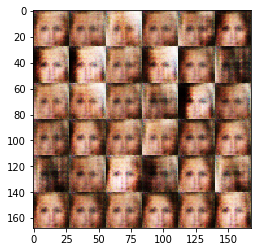

Epoch 1/2... Discriminator Loss: 1.4169... Generator Loss: 0.5099
Epoch 1/2... Discriminator Loss: 1.6702... Generator Loss: 1.0635
Epoch 1/2... Discriminator Loss: 1.0866... Generator Loss: 0.7440
Epoch 1/2... Discriminator Loss: 1.6693... Generator Loss: 0.4564
Epoch 1/2... Discriminator Loss: 1.7280... Generator Loss: 0.4065
Epoch 1/2... Discriminator Loss: 1.3175... Generator Loss: 1.1179
Epoch 1/2... Discriminator Loss: 1.5588... Generator Loss: 0.5569
Epoch 1/2... Discriminator Loss: 1.4989... Generator Loss: 0.4930
Epoch 1/2... Discriminator Loss: 1.6822... Generator Loss: 0.2827
Epoch 1/2... Discriminator Loss: 2.3846... Generator Loss: 0.1247


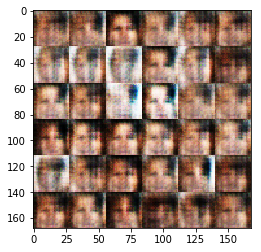

Epoch 1/2... Discriminator Loss: 1.7395... Generator Loss: 0.2513
Epoch 1/2... Discriminator Loss: 1.8046... Generator Loss: 0.2282
Epoch 1/2... Discriminator Loss: 2.1331... Generator Loss: 0.1586
Epoch 1/2... Discriminator Loss: 2.0756... Generator Loss: 0.1711
Epoch 1/2... Discriminator Loss: 2.6742... Generator Loss: 0.0915
Epoch 1/2... Discriminator Loss: 1.9656... Generator Loss: 0.1904
Epoch 1/2... Discriminator Loss: 1.9575... Generator Loss: 0.5438
Epoch 1/2... Discriminator Loss: 1.9826... Generator Loss: 0.2611
Epoch 1/2... Discriminator Loss: 1.8236... Generator Loss: 0.2294
Epoch 1/2... Discriminator Loss: 1.9303... Generator Loss: 0.2688


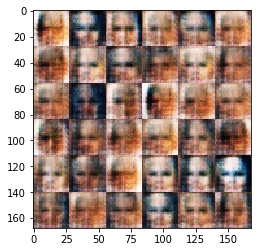

Epoch 1/2... Discriminator Loss: 1.4961... Generator Loss: 0.5608
Epoch 1/2... Discriminator Loss: 1.2449... Generator Loss: 0.8780
Epoch 1/2... Discriminator Loss: 1.5976... Generator Loss: 0.3467
Epoch 1/2... Discriminator Loss: 1.5316... Generator Loss: 0.4601
Epoch 1/2... Discriminator Loss: 2.0345... Generator Loss: 0.5420
Epoch 1/2... Discriminator Loss: 1.8337... Generator Loss: 0.2395
Epoch 1/2... Discriminator Loss: 1.4054... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 2.2536... Generator Loss: 0.4497
Epoch 1/2... Discriminator Loss: 1.7778... Generator Loss: 0.2449
Epoch 1/2... Discriminator Loss: 2.1256... Generator Loss: 0.8084


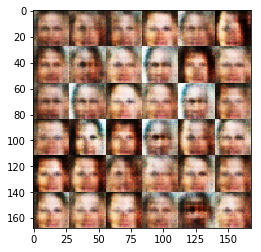

Epoch 1/2... Discriminator Loss: 1.6354... Generator Loss: 0.4981
Epoch 1/2... Discriminator Loss: 1.9182... Generator Loss: 0.2356
Epoch 1/2... Discriminator Loss: 1.2588... Generator Loss: 0.6540
Epoch 1/2... Discriminator Loss: 2.3724... Generator Loss: 0.3510
Epoch 1/2... Discriminator Loss: 1.5513... Generator Loss: 0.3230
Epoch 1/2... Discriminator Loss: 1.9868... Generator Loss: 0.1775
Epoch 1/2... Discriminator Loss: 1.7686... Generator Loss: 0.7455
Epoch 1/2... Discriminator Loss: 1.6158... Generator Loss: 0.5258
Epoch 1/2... Discriminator Loss: 2.5464... Generator Loss: 1.2275
Epoch 1/2... Discriminator Loss: 1.5278... Generator Loss: 0.3695


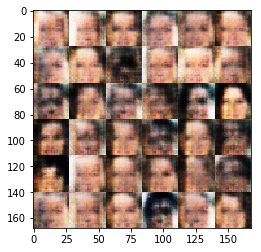

Epoch 1/2... Discriminator Loss: 2.1940... Generator Loss: 0.1596
Epoch 1/2... Discriminator Loss: 1.7103... Generator Loss: 0.2510
Epoch 1/2... Discriminator Loss: 1.2327... Generator Loss: 0.7780
Epoch 1/2... Discriminator Loss: 2.1227... Generator Loss: 0.1558
Epoch 1/2... Discriminator Loss: 1.7965... Generator Loss: 0.5328
Epoch 1/2... Discriminator Loss: 2.0877... Generator Loss: 0.2115
Epoch 1/2... Discriminator Loss: 1.9241... Generator Loss: 0.2940
Epoch 1/2... Discriminator Loss: 1.4713... Generator Loss: 0.6446
Epoch 1/2... Discriminator Loss: 2.3548... Generator Loss: 0.1539
Epoch 1/2... Discriminator Loss: 1.8492... Generator Loss: 0.2489


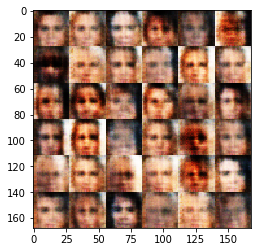

Epoch 1/2... Discriminator Loss: 1.8723... Generator Loss: 0.4729
Epoch 1/2... Discriminator Loss: 1.8228... Generator Loss: 0.2375
Epoch 1/2... Discriminator Loss: 1.8126... Generator Loss: 0.4632
Epoch 1/2... Discriminator Loss: 2.0508... Generator Loss: 0.1841
Epoch 1/2... Discriminator Loss: 1.5846... Generator Loss: 0.2820
Epoch 1/2... Discriminator Loss: 1.7823... Generator Loss: 0.2574
Epoch 1/2... Discriminator Loss: 1.5765... Generator Loss: 0.4749
Epoch 1/2... Discriminator Loss: 1.2669... Generator Loss: 0.5383
Epoch 1/2... Discriminator Loss: 1.4039... Generator Loss: 0.5041
Epoch 1/2... Discriminator Loss: 1.6681... Generator Loss: 1.4633


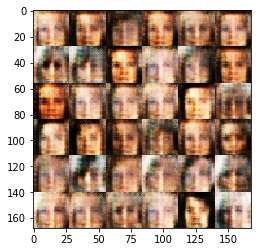

Epoch 1/2... Discriminator Loss: 1.6826... Generator Loss: 0.8078
Epoch 1/2... Discriminator Loss: 1.5834... Generator Loss: 0.4148
Epoch 1/2... Discriminator Loss: 2.1406... Generator Loss: 0.2353
Epoch 1/2... Discriminator Loss: 1.8725... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 1.8227... Generator Loss: 0.2104
Epoch 1/2... Discriminator Loss: 1.6791... Generator Loss: 0.3506
Epoch 1/2... Discriminator Loss: 1.7487... Generator Loss: 0.2560
Epoch 1/2... Discriminator Loss: 1.4845... Generator Loss: 0.4393
Epoch 1/2... Discriminator Loss: 1.8672... Generator Loss: 1.3141
Epoch 1/2... Discriminator Loss: 1.9607... Generator Loss: 0.4270


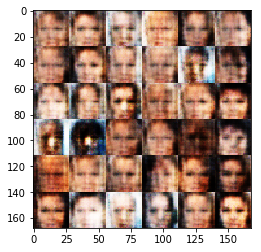

Epoch 1/2... Discriminator Loss: 1.6546... Generator Loss: 0.4171
Epoch 1/2... Discriminator Loss: 1.1965... Generator Loss: 0.5960
Epoch 1/2... Discriminator Loss: 1.4757... Generator Loss: 0.8731
Epoch 1/2... Discriminator Loss: 1.6294... Generator Loss: 0.3726
Epoch 1/2... Discriminator Loss: 1.7846... Generator Loss: 0.2757
Epoch 1/2... Discriminator Loss: 1.7745... Generator Loss: 0.2482
Epoch 1/2... Discriminator Loss: 1.4369... Generator Loss: 0.5779
Epoch 1/2... Discriminator Loss: 1.8022... Generator Loss: 0.5850
Epoch 1/2... Discriminator Loss: 1.8824... Generator Loss: 0.2679
Epoch 1/2... Discriminator Loss: 1.6831... Generator Loss: 0.6886


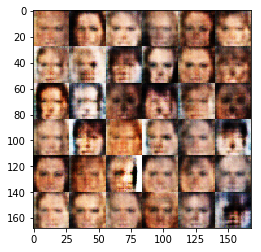

Epoch 1/2... Discriminator Loss: 1.8919... Generator Loss: 0.2079
Epoch 1/2... Discriminator Loss: 1.4498... Generator Loss: 0.6761
Epoch 1/2... Discriminator Loss: 1.8388... Generator Loss: 0.2197
Epoch 1/2... Discriminator Loss: 1.7652... Generator Loss: 0.2777
Epoch 1/2... Discriminator Loss: 0.9677... Generator Loss: 1.4089
Epoch 1/2... Discriminator Loss: 1.5099... Generator Loss: 0.7794
Epoch 1/2... Discriminator Loss: 1.2190... Generator Loss: 0.5290
Epoch 1/2... Discriminator Loss: 1.7864... Generator Loss: 0.5436
Epoch 1/2... Discriminator Loss: 1.9597... Generator Loss: 0.1948
Epoch 1/2... Discriminator Loss: 2.0951... Generator Loss: 0.2225


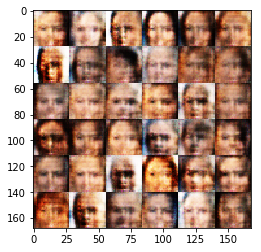

Epoch 1/2... Discriminator Loss: 1.7042... Generator Loss: 0.3345
Epoch 1/2... Discriminator Loss: 1.6928... Generator Loss: 0.2950
Epoch 1/2... Discriminator Loss: 1.3223... Generator Loss: 0.7506
Epoch 1/2... Discriminator Loss: 2.3726... Generator Loss: 0.1349
Epoch 1/2... Discriminator Loss: 1.1890... Generator Loss: 0.5314
Epoch 1/2... Discriminator Loss: 1.9916... Generator Loss: 0.1814
Epoch 1/2... Discriminator Loss: 1.7409... Generator Loss: 0.5863
Epoch 1/2... Discriminator Loss: 1.8284... Generator Loss: 0.6994
Epoch 1/2... Discriminator Loss: 1.8895... Generator Loss: 0.4565
Epoch 1/2... Discriminator Loss: 1.6286... Generator Loss: 0.3455


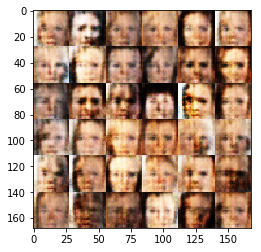

Epoch 1/2... Discriminator Loss: 2.8451... Generator Loss: 0.0689
Epoch 1/2... Discriminator Loss: 1.3337... Generator Loss: 0.8592
Epoch 1/2... Discriminator Loss: 1.7806... Generator Loss: 0.2749
Epoch 1/2... Discriminator Loss: 2.5645... Generator Loss: 0.0990
Epoch 1/2... Discriminator Loss: 1.8747... Generator Loss: 0.2560
Epoch 1/2... Discriminator Loss: 1.6666... Generator Loss: 0.2916
Epoch 1/2... Discriminator Loss: 1.8885... Generator Loss: 0.2168
Epoch 1/2... Discriminator Loss: 1.0902... Generator Loss: 1.5535
Epoch 1/2... Discriminator Loss: 1.5671... Generator Loss: 0.9494
Epoch 1/2... Discriminator Loss: 1.5578... Generator Loss: 0.4405


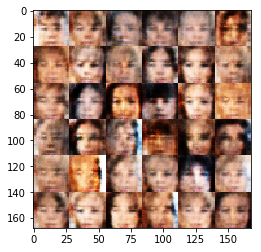

Epoch 1/2... Discriminator Loss: 2.6040... Generator Loss: 0.1040
Epoch 1/2... Discriminator Loss: 2.0014... Generator Loss: 0.2153
Epoch 1/2... Discriminator Loss: 2.7055... Generator Loss: 0.0891
Epoch 1/2... Discriminator Loss: 1.7506... Generator Loss: 0.3361
Epoch 1/2... Discriminator Loss: 1.4025... Generator Loss: 0.4982
Epoch 1/2... Discriminator Loss: 1.6762... Generator Loss: 0.5386
Epoch 1/2... Discriminator Loss: 1.7200... Generator Loss: 0.4239
Epoch 1/2... Discriminator Loss: 2.2899... Generator Loss: 0.1533
Epoch 1/2... Discriminator Loss: 2.3272... Generator Loss: 0.1575
Epoch 1/2... Discriminator Loss: 2.0211... Generator Loss: 0.1760


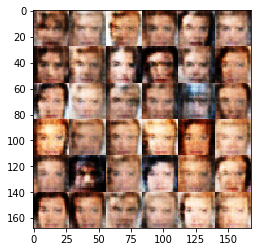

Epoch 1/2... Discriminator Loss: 1.8062... Generator Loss: 0.2758
Epoch 1/2... Discriminator Loss: 1.3628... Generator Loss: 0.5596
Epoch 1/2... Discriminator Loss: 2.0465... Generator Loss: 0.2003
Epoch 1/2... Discriminator Loss: 2.0415... Generator Loss: 0.6084
Epoch 1/2... Discriminator Loss: 2.0656... Generator Loss: 0.1760
Epoch 1/2... Discriminator Loss: 1.6475... Generator Loss: 0.7659
Epoch 1/2... Discriminator Loss: 1.8571... Generator Loss: 0.2388
Epoch 1/2... Discriminator Loss: 1.7391... Generator Loss: 0.3223
Epoch 1/2... Discriminator Loss: 1.6549... Generator Loss: 0.5875
Epoch 1/2... Discriminator Loss: 1.5558... Generator Loss: 0.6401


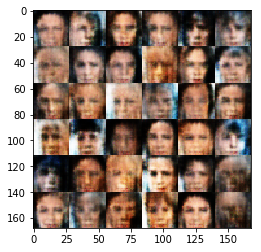

Epoch 1/2... Discriminator Loss: 1.6854... Generator Loss: 0.3047
Epoch 1/2... Discriminator Loss: 2.1579... Generator Loss: 0.3758
Epoch 1/2... Discriminator Loss: 2.4087... Generator Loss: 0.1361
Epoch 1/2... Discriminator Loss: 1.7393... Generator Loss: 0.3176
Epoch 1/2... Discriminator Loss: 1.9056... Generator Loss: 0.2110
Epoch 1/2... Discriminator Loss: 1.2171... Generator Loss: 0.9513
Epoch 1/2... Discriminator Loss: 1.6664... Generator Loss: 0.4510
Epoch 1/2... Discriminator Loss: 1.9007... Generator Loss: 0.6805
Epoch 1/2... Discriminator Loss: 1.8937... Generator Loss: 0.2391
Epoch 1/2... Discriminator Loss: 1.4602... Generator Loss: 0.4067


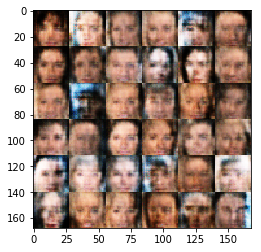

Epoch 1/2... Discriminator Loss: 2.0253... Generator Loss: 0.2875
Epoch 1/2... Discriminator Loss: 1.8419... Generator Loss: 0.5149
Epoch 1/2... Discriminator Loss: 1.7826... Generator Loss: 0.5632
Epoch 1/2... Discriminator Loss: 1.9657... Generator Loss: 0.2097
Epoch 1/2... Discriminator Loss: 3.1071... Generator Loss: 0.0549
Epoch 1/2... Discriminator Loss: 1.7146... Generator Loss: 0.4982
Epoch 1/2... Discriminator Loss: 1.5433... Generator Loss: 0.4542
Epoch 1/2... Discriminator Loss: 1.7259... Generator Loss: 0.4974
Epoch 1/2... Discriminator Loss: 1.7506... Generator Loss: 0.2672
Epoch 1/2... Discriminator Loss: 1.7472... Generator Loss: 0.2703


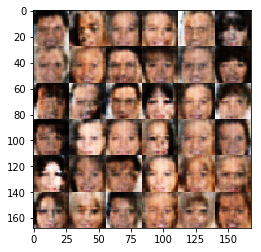

Epoch 1/2... Discriminator Loss: 3.0224... Generator Loss: 0.0543
Epoch 1/2... Discriminator Loss: 1.8163... Generator Loss: 0.3458
Epoch 1/2... Discriminator Loss: 1.2187... Generator Loss: 0.6208
Epoch 1/2... Discriminator Loss: 1.5944... Generator Loss: 0.4043
Epoch 1/2... Discriminator Loss: 1.8299... Generator Loss: 0.2347
Epoch 1/2... Discriminator Loss: 1.7626... Generator Loss: 0.6136
Epoch 1/2... Discriminator Loss: 1.8740... Generator Loss: 0.2187
Epoch 1/2... Discriminator Loss: 2.1985... Generator Loss: 0.1562
Epoch 1/2... Discriminator Loss: 1.3032... Generator Loss: 1.2966
Epoch 1/2... Discriminator Loss: 1.5627... Generator Loss: 0.3994


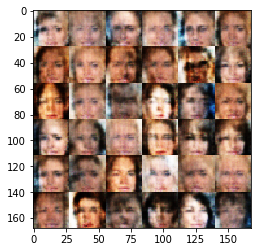

Epoch 1/2... Discriminator Loss: 1.9929... Generator Loss: 0.2152
Epoch 1/2... Discriminator Loss: 1.8657... Generator Loss: 0.4244
Epoch 1/2... Discriminator Loss: 1.4082... Generator Loss: 0.4766
Epoch 1/2... Discriminator Loss: 2.0560... Generator Loss: 0.1839
Epoch 1/2... Discriminator Loss: 2.0800... Generator Loss: 0.4276
Epoch 1/2... Discriminator Loss: 2.2364... Generator Loss: 0.1550
Epoch 1/2... Discriminator Loss: 1.9528... Generator Loss: 0.2142
Epoch 1/2... Discriminator Loss: 2.0054... Generator Loss: 0.5678
Epoch 1/2... Discriminator Loss: 1.7919... Generator Loss: 0.4079
Epoch 1/2... Discriminator Loss: 1.4891... Generator Loss: 0.7262


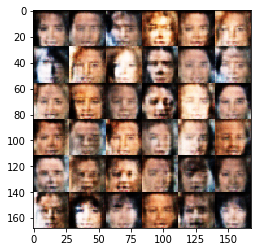

Epoch 1/2... Discriminator Loss: 1.7117... Generator Loss: 0.4417
Epoch 1/2... Discriminator Loss: 2.4825... Generator Loss: 0.1324
Epoch 1/2... Discriminator Loss: 1.0411... Generator Loss: 0.9807
Epoch 1/2... Discriminator Loss: 1.7458... Generator Loss: 0.7293
Epoch 1/2... Discriminator Loss: 1.3758... Generator Loss: 0.7569
Epoch 1/2... Discriminator Loss: 0.8633... Generator Loss: 0.7663
Epoch 1/2... Discriminator Loss: 1.0299... Generator Loss: 1.4586
Epoch 1/2... Discriminator Loss: 1.8850... Generator Loss: 0.2330
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 0.6565
Epoch 1/2... Discriminator Loss: 1.3168... Generator Loss: 0.9984


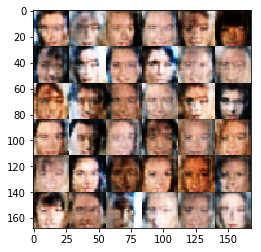

Epoch 1/2... Discriminator Loss: 1.5058... Generator Loss: 0.6464
Epoch 1/2... Discriminator Loss: 2.0388... Generator Loss: 0.1870
Epoch 1/2... Discriminator Loss: 2.6161... Generator Loss: 0.0916
Epoch 1/2... Discriminator Loss: 1.6654... Generator Loss: 0.3531
Epoch 1/2... Discriminator Loss: 1.3350... Generator Loss: 0.6487
Epoch 1/2... Discriminator Loss: 1.7637... Generator Loss: 0.2690
Epoch 1/2... Discriminator Loss: 2.0998... Generator Loss: 0.1998
Epoch 1/2... Discriminator Loss: 1.7731... Generator Loss: 0.2956
Epoch 1/2... Discriminator Loss: 2.0179... Generator Loss: 0.1826
Epoch 1/2... Discriminator Loss: 1.4801... Generator Loss: 0.4566


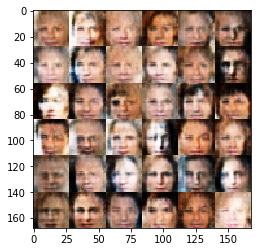

Epoch 1/2... Discriminator Loss: 1.4535... Generator Loss: 0.9046
Epoch 1/2... Discriminator Loss: 1.9248... Generator Loss: 0.2555
Epoch 1/2... Discriminator Loss: 0.9375... Generator Loss: 0.9132
Epoch 1/2... Discriminator Loss: 2.3564... Generator Loss: 0.1285
Epoch 1/2... Discriminator Loss: 1.0200... Generator Loss: 1.4843
Epoch 1/2... Discriminator Loss: 1.4780... Generator Loss: 0.5169
Epoch 1/2... Discriminator Loss: 1.3766... Generator Loss: 1.0331
Epoch 1/2... Discriminator Loss: 1.3397... Generator Loss: 0.7799
Epoch 1/2... Discriminator Loss: 1.9200... Generator Loss: 0.2204
Epoch 1/2... Discriminator Loss: 1.5122... Generator Loss: 0.6119


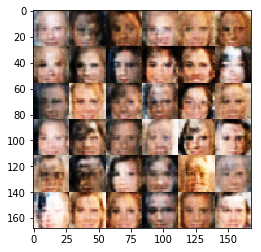

Epoch 1/2... Discriminator Loss: 1.8167... Generator Loss: 0.3012
Epoch 1/2... Discriminator Loss: 2.2592... Generator Loss: 0.1298
Epoch 1/2... Discriminator Loss: 2.1610... Generator Loss: 0.1530
Epoch 1/2... Discriminator Loss: 1.7217... Generator Loss: 0.6298
Epoch 1/2... Discriminator Loss: 1.9979... Generator Loss: 0.2164
Epoch 1/2... Discriminator Loss: 1.9940... Generator Loss: 0.2128
Epoch 1/2... Discriminator Loss: 1.1712... Generator Loss: 0.8044
Epoch 1/2... Discriminator Loss: 0.7918... Generator Loss: 1.1747
Epoch 1/2... Discriminator Loss: 1.0883... Generator Loss: 1.0054
Epoch 1/2... Discriminator Loss: 2.1549... Generator Loss: 0.5560


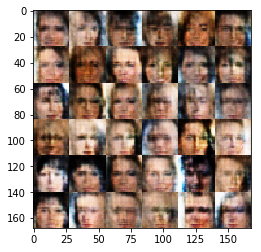

Epoch 1/2... Discriminator Loss: 1.6912... Generator Loss: 0.5467
Epoch 1/2... Discriminator Loss: 2.0841... Generator Loss: 0.1940
Epoch 1/2... Discriminator Loss: 1.7963... Generator Loss: 0.6489
Epoch 1/2... Discriminator Loss: 1.9354... Generator Loss: 0.2786
Epoch 1/2... Discriminator Loss: 2.7204... Generator Loss: 0.0805
Epoch 1/2... Discriminator Loss: 1.8510... Generator Loss: 0.9278
Epoch 1/2... Discriminator Loss: 2.4428... Generator Loss: 0.1063
Epoch 1/2... Discriminator Loss: 1.4953... Generator Loss: 0.7119
Epoch 1/2... Discriminator Loss: 1.3596... Generator Loss: 0.4568
Epoch 1/2... Discriminator Loss: 1.3974... Generator Loss: 1.0467


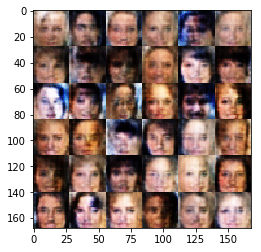

Epoch 1/2... Discriminator Loss: 1.8485... Generator Loss: 0.2333
Epoch 1/2... Discriminator Loss: 1.7176... Generator Loss: 0.2434
Epoch 1/2... Discriminator Loss: 2.1429... Generator Loss: 0.1627
Epoch 1/2... Discriminator Loss: 2.1737... Generator Loss: 0.1625
Epoch 1/2... Discriminator Loss: 1.1900... Generator Loss: 0.6843
Epoch 1/2... Discriminator Loss: 1.4565... Generator Loss: 0.8183
Epoch 1/2... Discriminator Loss: 1.7398... Generator Loss: 0.7830
Epoch 1/2... Discriminator Loss: 2.2159... Generator Loss: 0.1615
Epoch 1/2... Discriminator Loss: 1.8342... Generator Loss: 0.2581
Epoch 1/2... Discriminator Loss: 1.3926... Generator Loss: 0.8122


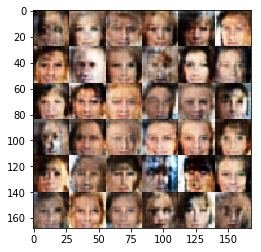

Epoch 1/2... Discriminator Loss: 1.6544... Generator Loss: 0.4529
Epoch 1/2... Discriminator Loss: 1.1640... Generator Loss: 0.6238
Epoch 1/2... Discriminator Loss: 1.9707... Generator Loss: 0.2723
Epoch 1/2... Discriminator Loss: 1.2567... Generator Loss: 0.6682
Epoch 1/2... Discriminator Loss: 1.5104... Generator Loss: 0.3390
Epoch 1/2... Discriminator Loss: 1.5766... Generator Loss: 0.5348
Epoch 1/2... Discriminator Loss: 1.6062... Generator Loss: 0.5011
Epoch 1/2... Discriminator Loss: 2.6706... Generator Loss: 0.0840
Epoch 1/2... Discriminator Loss: 1.9591... Generator Loss: 0.3093
Epoch 1/2... Discriminator Loss: 1.9349... Generator Loss: 0.2982


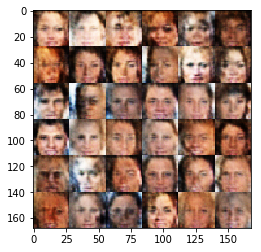

Epoch 1/2... Discriminator Loss: 1.9125... Generator Loss: 0.2036
Epoch 1/2... Discriminator Loss: 1.5847... Generator Loss: 0.5543
Epoch 1/2... Discriminator Loss: 0.9560... Generator Loss: 1.4375
Epoch 1/2... Discriminator Loss: 1.6102... Generator Loss: 0.4990
Epoch 1/2... Discriminator Loss: 1.7268... Generator Loss: 0.2625
Epoch 1/2... Discriminator Loss: 2.0367... Generator Loss: 0.1983
Epoch 1/2... Discriminator Loss: 1.7085... Generator Loss: 0.2766
Epoch 1/2... Discriminator Loss: 1.3685... Generator Loss: 1.0225
Epoch 1/2... Discriminator Loss: 2.0160... Generator Loss: 0.5112
Epoch 1/2... Discriminator Loss: 1.0928... Generator Loss: 0.8241


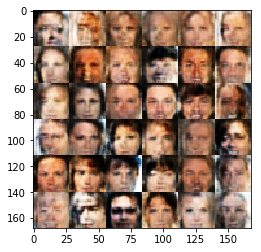

Epoch 1/2... Discriminator Loss: 1.8764... Generator Loss: 0.2886
Epoch 1/2... Discriminator Loss: 1.7655... Generator Loss: 0.2421
Epoch 1/2... Discriminator Loss: 1.9779... Generator Loss: 0.2648
Epoch 1/2... Discriminator Loss: 2.1751... Generator Loss: 0.2260
Epoch 1/2... Discriminator Loss: 1.7194... Generator Loss: 0.5285
Epoch 1/2... Discriminator Loss: 1.9495... Generator Loss: 0.2121
Epoch 1/2... Discriminator Loss: 2.1865... Generator Loss: 0.2415
Epoch 1/2... Discriminator Loss: 1.4618... Generator Loss: 0.7489
Epoch 1/2... Discriminator Loss: 2.0271... Generator Loss: 0.2044
Epoch 1/2... Discriminator Loss: 2.1856... Generator Loss: 0.1426


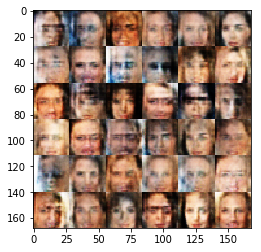

Epoch 1/2... Discriminator Loss: 1.7286... Generator Loss: 0.3094
Epoch 1/2... Discriminator Loss: 1.4053... Generator Loss: 0.4410
Epoch 1/2... Discriminator Loss: 2.1787... Generator Loss: 0.1568
Epoch 1/2... Discriminator Loss: 1.7517... Generator Loss: 0.6432
Epoch 1/2... Discriminator Loss: 1.6926... Generator Loss: 0.5695
Epoch 1/2... Discriminator Loss: 1.8803... Generator Loss: 0.4147
Epoch 1/2... Discriminator Loss: 2.4723... Generator Loss: 0.1175
Epoch 1/2... Discriminator Loss: 1.5266... Generator Loss: 0.4537
Epoch 1/2... Discriminator Loss: 2.0362... Generator Loss: 0.2791
Epoch 1/2... Discriminator Loss: 1.4554... Generator Loss: 0.4341


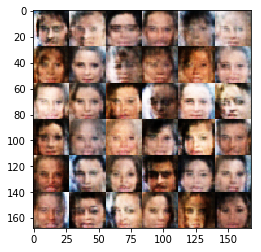

Epoch 1/2... Discriminator Loss: 1.7460... Generator Loss: 0.3545
Epoch 1/2... Discriminator Loss: 1.8428... Generator Loss: 0.3065
Epoch 1/2... Discriminator Loss: 1.2595... Generator Loss: 0.6163
Epoch 1/2... Discriminator Loss: 1.8385... Generator Loss: 0.2279
Epoch 1/2... Discriminator Loss: 1.9329... Generator Loss: 0.3278
Epoch 1/2... Discriminator Loss: 1.8407... Generator Loss: 0.3115
Epoch 1/2... Discriminator Loss: 2.0265... Generator Loss: 0.3567
Epoch 1/2... Discriminator Loss: 1.4738... Generator Loss: 0.5876
Epoch 1/2... Discriminator Loss: 1.6415... Generator Loss: 0.4338
Epoch 1/2... Discriminator Loss: 1.1897... Generator Loss: 0.7342


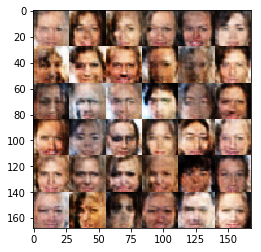

Epoch 1/2... Discriminator Loss: 1.5221... Generator Loss: 0.5289
Epoch 1/2... Discriminator Loss: 2.6871... Generator Loss: 0.0919
Epoch 1/2... Discriminator Loss: 1.7054... Generator Loss: 0.3508
Epoch 1/2... Discriminator Loss: 1.5869... Generator Loss: 0.5139
Epoch 1/2... Discriminator Loss: 3.0761... Generator Loss: 0.0528
Epoch 1/2... Discriminator Loss: 2.1215... Generator Loss: 0.2929
Epoch 1/2... Discriminator Loss: 3.2211... Generator Loss: 0.0487
Epoch 1/2... Discriminator Loss: 1.2166... Generator Loss: 0.6233
Epoch 1/2... Discriminator Loss: 2.1594... Generator Loss: 0.1573
Epoch 1/2... Discriminator Loss: 1.9104... Generator Loss: 0.2375


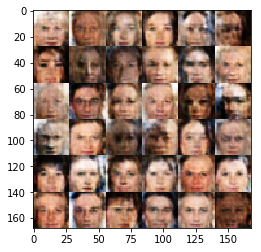

Epoch 1/2... Discriminator Loss: 1.6814... Generator Loss: 0.6147
Epoch 1/2... Discriminator Loss: 1.6252... Generator Loss: 0.4187
Epoch 1/2... Discriminator Loss: 1.8981... Generator Loss: 0.2745
Epoch 1/2... Discriminator Loss: 1.7186... Generator Loss: 0.3159
Epoch 1/2... Discriminator Loss: 1.4580... Generator Loss: 0.3795
Epoch 1/2... Discriminator Loss: 2.1311... Generator Loss: 0.1663
Epoch 1/2... Discriminator Loss: 1.7279... Generator Loss: 0.3457
Epoch 1/2... Discriminator Loss: 1.8849... Generator Loss: 0.5298
Epoch 1/2... Discriminator Loss: 1.9982... Generator Loss: 0.2096
Epoch 1/2... Discriminator Loss: 1.7516... Generator Loss: 0.2556


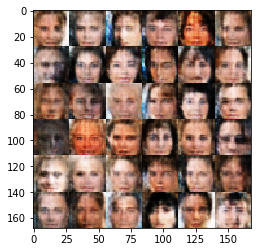

Epoch 1/2... Discriminator Loss: 1.8463... Generator Loss: 0.4380
Epoch 1/2... Discriminator Loss: 1.3670... Generator Loss: 0.5252
Epoch 1/2... Discriminator Loss: 2.0716... Generator Loss: 0.3819
Epoch 1/2... Discriminator Loss: 2.0265... Generator Loss: 0.1650
Epoch 1/2... Discriminator Loss: 1.8648... Generator Loss: 0.2486
Epoch 1/2... Discriminator Loss: 1.6376... Generator Loss: 0.4228
Epoch 1/2... Discriminator Loss: 1.2958... Generator Loss: 0.5145
Epoch 1/2... Discriminator Loss: 1.7550... Generator Loss: 0.2872
Epoch 1/2... Discriminator Loss: 0.8696... Generator Loss: 1.3157
Epoch 1/2... Discriminator Loss: 1.5574... Generator Loss: 0.4902


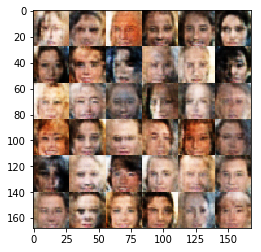

Epoch 1/2... Discriminator Loss: 1.7838... Generator Loss: 0.3102
Epoch 1/2... Discriminator Loss: 1.4680... Generator Loss: 0.5197
Epoch 1/2... Discriminator Loss: 1.6659... Generator Loss: 0.3594
Epoch 1/2... Discriminator Loss: 1.8872... Generator Loss: 0.4135
Epoch 1/2... Discriminator Loss: 2.2624... Generator Loss: 0.1453
Epoch 1/2... Discriminator Loss: 1.8223... Generator Loss: 0.2501
Epoch 1/2... Discriminator Loss: 1.6495... Generator Loss: 0.4129
Epoch 1/2... Discriminator Loss: 0.9872... Generator Loss: 0.8359
Epoch 1/2... Discriminator Loss: 2.1330... Generator Loss: 0.1934
Epoch 1/2... Discriminator Loss: 2.1555... Generator Loss: 0.1480


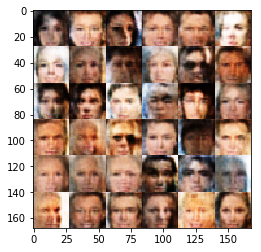

Epoch 1/2... Discriminator Loss: 1.3893... Generator Loss: 0.9648
Epoch 1/2... Discriminator Loss: 1.5682... Generator Loss: 0.4919
Epoch 1/2... Discriminator Loss: 2.1151... Generator Loss: 0.1803
Epoch 1/2... Discriminator Loss: 2.1798... Generator Loss: 0.1651
Epoch 1/2... Discriminator Loss: 1.8365... Generator Loss: 0.2935
Epoch 1/2... Discriminator Loss: 1.9351... Generator Loss: 0.2686
Epoch 1/2... Discriminator Loss: 1.8054... Generator Loss: 0.2856
Epoch 1/2... Discriminator Loss: 1.7308... Generator Loss: 0.2676
Epoch 1/2... Discriminator Loss: 1.4782... Generator Loss: 0.3245
Epoch 1/2... Discriminator Loss: 2.1223... Generator Loss: 0.1700


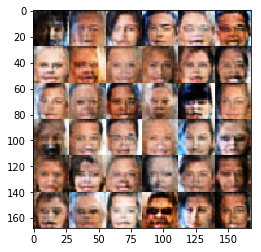

Epoch 1/2... Discriminator Loss: 1.1958... Generator Loss: 0.9355
Epoch 1/2... Discriminator Loss: 1.6331... Generator Loss: 0.7836
Epoch 1/2... Discriminator Loss: 2.2908... Generator Loss: 0.1303
Epoch 1/2... Discriminator Loss: 1.6244... Generator Loss: 0.4409
Epoch 1/2... Discriminator Loss: 2.2045... Generator Loss: 0.1621
Epoch 1/2... Discriminator Loss: 1.6111... Generator Loss: 0.4982
Epoch 1/2... Discriminator Loss: 1.4476... Generator Loss: 0.4946
Epoch 1/2... Discriminator Loss: 1.8759... Generator Loss: 0.3159
Epoch 1/2... Discriminator Loss: 1.6273... Generator Loss: 0.3996
Epoch 1/2... Discriminator Loss: 1.9815... Generator Loss: 0.2323


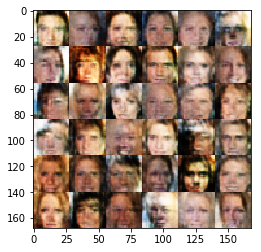

Epoch 1/2... Discriminator Loss: 2.4985... Generator Loss: 0.1031
Epoch 1/2... Discriminator Loss: 1.5744... Generator Loss: 0.5025
Epoch 1/2... Discriminator Loss: 2.4276... Generator Loss: 0.1154
Epoch 1/2... Discriminator Loss: 1.6715... Generator Loss: 0.3036
Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 0.4576
Epoch 1/2... Discriminator Loss: 1.7531... Generator Loss: 0.4274
Epoch 1/2... Discriminator Loss: 1.8727... Generator Loss: 0.2302
Epoch 1/2... Discriminator Loss: 1.7585... Generator Loss: 0.3652
Epoch 1/2... Discriminator Loss: 1.4442... Generator Loss: 0.4269
Epoch 1/2... Discriminator Loss: 1.8880... Generator Loss: 0.4923


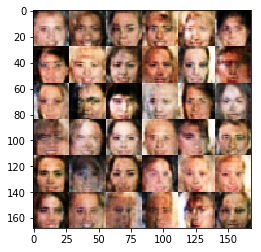

Epoch 1/2... Discriminator Loss: 2.1243... Generator Loss: 0.4775
Epoch 1/2... Discriminator Loss: 1.4982... Generator Loss: 0.5054
Epoch 1/2... Discriminator Loss: 1.9499... Generator Loss: 0.2153
Epoch 1/2... Discriminator Loss: 2.1469... Generator Loss: 0.2673
Epoch 1/2... Discriminator Loss: 1.9263... Generator Loss: 0.3502
Epoch 1/2... Discriminator Loss: 1.7280... Generator Loss: 0.5374
Epoch 1/2... Discriminator Loss: 1.8543... Generator Loss: 0.2303
Epoch 1/2... Discriminator Loss: 1.8838... Generator Loss: 0.4458
Epoch 1/2... Discriminator Loss: 1.8983... Generator Loss: 0.2292
Epoch 1/2... Discriminator Loss: 1.6279... Generator Loss: 0.3441


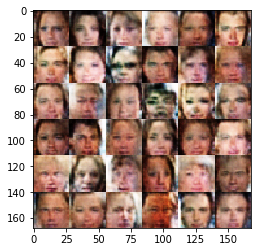

Epoch 1/2... Discriminator Loss: 1.9493... Generator Loss: 0.2444
Epoch 1/2... Discriminator Loss: 1.7974... Generator Loss: 0.5502
Epoch 1/2... Discriminator Loss: 1.8631... Generator Loss: 0.2398
Epoch 1/2... Discriminator Loss: 2.3146... Generator Loss: 0.1671
Epoch 1/2... Discriminator Loss: 2.1907... Generator Loss: 0.1645
Epoch 1/2... Discriminator Loss: 2.0223... Generator Loss: 0.2010
Epoch 1/2... Discriminator Loss: 1.8851... Generator Loss: 0.4017
Epoch 1/2... Discriminator Loss: 2.1423... Generator Loss: 0.4093
Epoch 1/2... Discriminator Loss: 1.9610... Generator Loss: 0.3006
Epoch 1/2... Discriminator Loss: 2.2357... Generator Loss: 0.1756


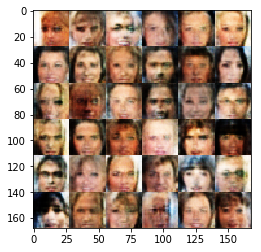

Epoch 1/2... Discriminator Loss: 1.7048... Generator Loss: 0.2807
Epoch 1/2... Discriminator Loss: 1.9077... Generator Loss: 0.2578
Epoch 1/2... Discriminator Loss: 1.7866... Generator Loss: 0.4078
Epoch 1/2... Discriminator Loss: 1.4906... Generator Loss: 0.4248
Epoch 1/2... Discriminator Loss: 2.2754... Generator Loss: 0.1507
Epoch 1/2... Discriminator Loss: 1.8758... Generator Loss: 0.2307
Epoch 1/2... Discriminator Loss: 1.5222... Generator Loss: 0.4321
Epoch 1/2... Discriminator Loss: 2.4510... Generator Loss: 0.3167
Epoch 1/2... Discriminator Loss: 2.2496... Generator Loss: 0.1431
Epoch 1/2... Discriminator Loss: 1.7684... Generator Loss: 0.3867


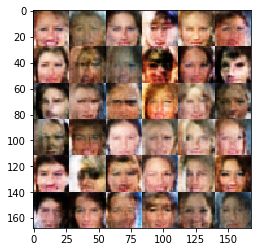

Epoch 1/2... Discriminator Loss: 1.6308... Generator Loss: 0.4772
Epoch 1/2... Discriminator Loss: 1.7040... Generator Loss: 0.2601
Epoch 1/2... Discriminator Loss: 1.9092... Generator Loss: 0.5210
Epoch 1/2... Discriminator Loss: 2.4757... Generator Loss: 0.1206
Epoch 1/2... Discriminator Loss: 2.3953... Generator Loss: 0.2613
Epoch 1/2... Discriminator Loss: 1.8253... Generator Loss: 0.2105
Epoch 1/2... Discriminator Loss: 2.4282... Generator Loss: 0.1101
Epoch 1/2... Discriminator Loss: 1.4873... Generator Loss: 0.4941
Epoch 1/2... Discriminator Loss: 2.1025... Generator Loss: 0.2031
Epoch 1/2... Discriminator Loss: 1.5299... Generator Loss: 0.3730


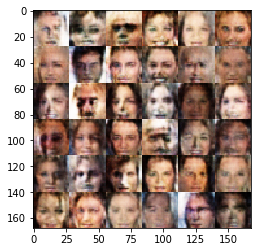

Epoch 1/2... Discriminator Loss: 1.7339... Generator Loss: 0.5699
Epoch 1/2... Discriminator Loss: 1.1851... Generator Loss: 0.6122
Epoch 1/2... Discriminator Loss: 2.3475... Generator Loss: 0.1136
Epoch 1/2... Discriminator Loss: 2.3818... Generator Loss: 0.1230
Epoch 1/2... Discriminator Loss: 1.4870... Generator Loss: 0.5634
Epoch 1/2... Discriminator Loss: 1.5073... Generator Loss: 0.3635
Epoch 1/2... Discriminator Loss: 2.5095... Generator Loss: 0.1295
Epoch 1/2... Discriminator Loss: 1.4994... Generator Loss: 0.3656
Epoch 1/2... Discriminator Loss: 2.0410... Generator Loss: 0.1785
Epoch 1/2... Discriminator Loss: 1.5275... Generator Loss: 0.3599


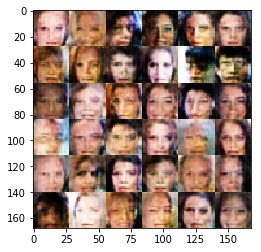

Epoch 1/2... Discriminator Loss: 1.8211... Generator Loss: 0.2533
Epoch 1/2... Discriminator Loss: 1.7593... Generator Loss: 0.2607
Epoch 1/2... Discriminator Loss: 1.9702... Generator Loss: 0.2859
Epoch 1/2... Discriminator Loss: 1.2645... Generator Loss: 0.6333
Epoch 1/2... Discriminator Loss: 2.3639... Generator Loss: 0.2084
Epoch 1/2... Discriminator Loss: 2.6555... Generator Loss: 0.0956
Epoch 1/2... Discriminator Loss: 2.0355... Generator Loss: 0.1860
Epoch 1/2... Discriminator Loss: 1.9478... Generator Loss: 0.1874
Epoch 1/2... Discriminator Loss: 1.5263... Generator Loss: 1.0953
Epoch 1/2... Discriminator Loss: 2.2247... Generator Loss: 0.2008


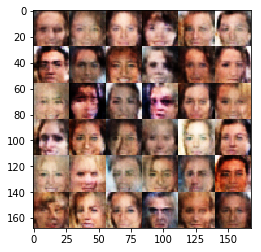

Epoch 1/2... Discriminator Loss: 1.6660... Generator Loss: 0.3855
Epoch 1/2... Discriminator Loss: 1.4644... Generator Loss: 0.8953
Epoch 1/2... Discriminator Loss: 2.4207... Generator Loss: 0.1101
Epoch 1/2... Discriminator Loss: 1.9293... Generator Loss: 0.2292
Epoch 1/2... Discriminator Loss: 2.4919... Generator Loss: 0.1355
Epoch 1/2... Discriminator Loss: 1.8087... Generator Loss: 0.3431
Epoch 1/2... Discriminator Loss: 2.0458... Generator Loss: 0.1711
Epoch 1/2... Discriminator Loss: 1.9519... Generator Loss: 0.5825
Epoch 1/2... Discriminator Loss: 2.0310... Generator Loss: 0.2574
Epoch 1/2... Discriminator Loss: 1.6432... Generator Loss: 0.3051


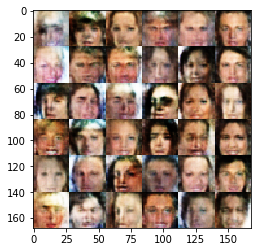

Epoch 1/2... Discriminator Loss: 2.1803... Generator Loss: 0.1814
Epoch 1/2... Discriminator Loss: 2.1991... Generator Loss: 0.1595
Epoch 1/2... Discriminator Loss: 1.1461... Generator Loss: 0.7913
Epoch 1/2... Discriminator Loss: 1.9123... Generator Loss: 0.2780
Epoch 1/2... Discriminator Loss: 1.8863... Generator Loss: 0.2473
Epoch 1/2... Discriminator Loss: 1.4882... Generator Loss: 0.4773
Epoch 1/2... Discriminator Loss: 1.6223... Generator Loss: 0.4415
Epoch 1/2... Discriminator Loss: 2.3850... Generator Loss: 0.1101
Epoch 1/2... Discriminator Loss: 1.4618... Generator Loss: 0.5245
Epoch 1/2... Discriminator Loss: 1.7603... Generator Loss: 0.5989


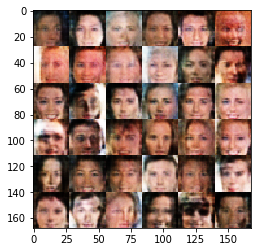

Epoch 1/2... Discriminator Loss: 1.8090... Generator Loss: 0.3679
Epoch 1/2... Discriminator Loss: 2.2732... Generator Loss: 0.1643
Epoch 1/2... Discriminator Loss: 1.2911... Generator Loss: 0.6261
Epoch 1/2... Discriminator Loss: 1.6525... Generator Loss: 0.3269
Epoch 1/2... Discriminator Loss: 2.3707... Generator Loss: 0.1225
Epoch 1/2... Discriminator Loss: 2.1422... Generator Loss: 0.1693
Epoch 1/2... Discriminator Loss: 2.6677... Generator Loss: 0.0939
Epoch 1/2... Discriminator Loss: 2.1138... Generator Loss: 0.3670
Epoch 1/2... Discriminator Loss: 2.5793... Generator Loss: 0.0954
Epoch 1/2... Discriminator Loss: 2.1778... Generator Loss: 0.1550


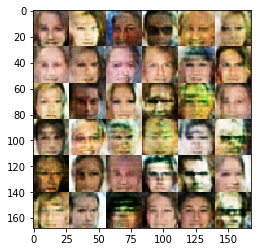

Epoch 1/2... Discriminator Loss: 1.9713... Generator Loss: 0.2128
Epoch 1/2... Discriminator Loss: 1.2597... Generator Loss: 0.5374
Epoch 1/2... Discriminator Loss: 1.3881... Generator Loss: 0.4216
Epoch 1/2... Discriminator Loss: 1.9769... Generator Loss: 0.1644
Epoch 1/2... Discriminator Loss: 1.7589... Generator Loss: 0.3843
Epoch 1/2... Discriminator Loss: 1.3613... Generator Loss: 0.5102
Epoch 1/2... Discriminator Loss: 2.2411... Generator Loss: 0.2172
Epoch 1/2... Discriminator Loss: 1.7679... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 2.5815... Generator Loss: 0.1034
Epoch 1/2... Discriminator Loss: 1.6948... Generator Loss: 0.3750


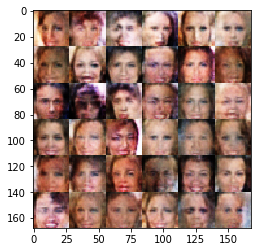

Epoch 1/2... Discriminator Loss: 1.5952... Generator Loss: 0.2926
Epoch 1/2... Discriminator Loss: 1.3622... Generator Loss: 0.4828
Epoch 1/2... Discriminator Loss: 1.3944... Generator Loss: 0.5134
Epoch 1/2... Discriminator Loss: 2.0913... Generator Loss: 0.1735
Epoch 1/2... Discriminator Loss: 2.3831... Generator Loss: 0.1237
Epoch 1/2... Discriminator Loss: 2.6463... Generator Loss: 0.1154
Epoch 1/2... Discriminator Loss: 2.4408... Generator Loss: 0.1199
Epoch 1/2... Discriminator Loss: 1.8410... Generator Loss: 0.2873
Epoch 1/2... Discriminator Loss: 1.1686... Generator Loss: 0.9474
Epoch 1/2... Discriminator Loss: 1.9562... Generator Loss: 0.1887


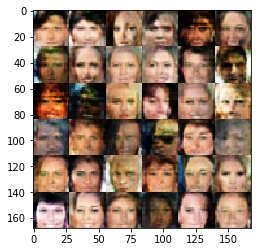

Epoch 1/2... Discriminator Loss: 1.6667... Generator Loss: 0.6434
Epoch 1/2... Discriminator Loss: 1.9394... Generator Loss: 0.3067
Epoch 1/2... Discriminator Loss: 1.9658... Generator Loss: 0.1941
Epoch 1/2... Discriminator Loss: 1.1083... Generator Loss: 0.7237
Epoch 1/2... Discriminator Loss: 2.1575... Generator Loss: 0.1826
Epoch 1/2... Discriminator Loss: 1.7031... Generator Loss: 0.2572
Epoch 1/2... Discriminator Loss: 2.5029... Generator Loss: 0.1348
Epoch 1/2... Discriminator Loss: 1.8506... Generator Loss: 0.3134
Epoch 1/2... Discriminator Loss: 1.2311... Generator Loss: 0.5482
Epoch 1/2... Discriminator Loss: 2.2774... Generator Loss: 0.1479


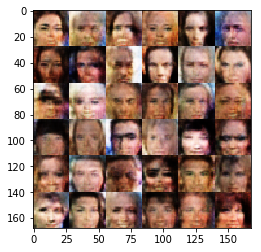

Epoch 1/2... Discriminator Loss: 1.9436... Generator Loss: 0.2293
Epoch 1/2... Discriminator Loss: 2.0808... Generator Loss: 0.3039
Epoch 1/2... Discriminator Loss: 2.3922... Generator Loss: 0.1167
Epoch 1/2... Discriminator Loss: 1.6949... Generator Loss: 0.4823
Epoch 1/2... Discriminator Loss: 1.5282... Generator Loss: 0.2971
Epoch 1/2... Discriminator Loss: 1.8070... Generator Loss: 0.5603
Epoch 1/2... Discriminator Loss: 1.7946... Generator Loss: 0.2497
Epoch 1/2... Discriminator Loss: 2.0240... Generator Loss: 0.5577
Epoch 1/2... Discriminator Loss: 2.0737... Generator Loss: 0.2149
Epoch 1/2... Discriminator Loss: 2.4716... Generator Loss: 0.1099


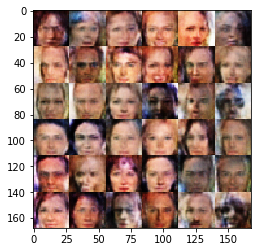

Epoch 1/2... Discriminator Loss: 2.0933... Generator Loss: 0.1461
Epoch 1/2... Discriminator Loss: 1.4409... Generator Loss: 0.6235
Epoch 1/2... Discriminator Loss: 2.0467... Generator Loss: 0.1824
Epoch 1/2... Discriminator Loss: 1.9615... Generator Loss: 0.1799
Epoch 1/2... Discriminator Loss: 1.7385... Generator Loss: 0.2389
Epoch 1/2... Discriminator Loss: 1.4669... Generator Loss: 0.3834
Epoch 1/2... Discriminator Loss: 1.9465... Generator Loss: 0.1983
Epoch 1/2... Discriminator Loss: 2.1437... Generator Loss: 0.1678
Epoch 1/2... Discriminator Loss: 2.0483... Generator Loss: 0.2202
Epoch 1/2... Discriminator Loss: 2.3684... Generator Loss: 0.1619


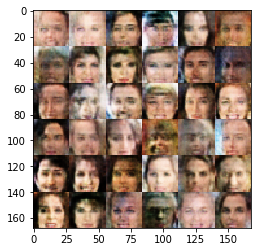

Epoch 1/2... Discriminator Loss: 1.3503... Generator Loss: 0.9023
Epoch 1/2... Discriminator Loss: 2.5317... Generator Loss: 0.1047
Epoch 1/2... Discriminator Loss: 1.6825... Generator Loss: 0.3405
Epoch 1/2... Discriminator Loss: 1.4843... Generator Loss: 0.3421
Epoch 1/2... Discriminator Loss: 1.9602... Generator Loss: 0.1947
Epoch 1/2... Discriminator Loss: 2.1839... Generator Loss: 0.2007
Epoch 1/2... Discriminator Loss: 2.6965... Generator Loss: 0.0841
Epoch 1/2... Discriminator Loss: 1.7245... Generator Loss: 0.3769
Epoch 1/2... Discriminator Loss: 2.5517... Generator Loss: 0.1025
Epoch 1/2... Discriminator Loss: 1.7662... Generator Loss: 0.2789


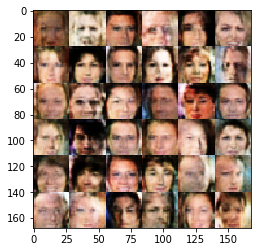

Epoch 1/2... Discriminator Loss: 1.4458... Generator Loss: 0.4549
Epoch 1/2... Discriminator Loss: 2.3015... Generator Loss: 0.1270
Epoch 1/2... Discriminator Loss: 2.4729... Generator Loss: 0.1136
Epoch 2/2... Discriminator Loss: 1.9253... Generator Loss: 0.2211
Epoch 2/2... Discriminator Loss: 1.8630... Generator Loss: 0.2692
Epoch 2/2... Discriminator Loss: 2.0462... Generator Loss: 0.1763
Epoch 2/2... Discriminator Loss: 2.2722... Generator Loss: 0.1276
Epoch 2/2... Discriminator Loss: 2.0750... Generator Loss: 0.2814
Epoch 2/2... Discriminator Loss: 2.2017... Generator Loss: 0.1436
Epoch 2/2... Discriminator Loss: 1.8195... Generator Loss: 0.3117


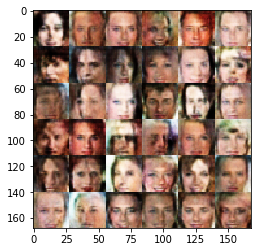

Epoch 2/2... Discriminator Loss: 1.5012... Generator Loss: 0.3446
Epoch 2/2... Discriminator Loss: 1.9055... Generator Loss: 0.2324
Epoch 2/2... Discriminator Loss: 1.6343... Generator Loss: 0.3212
Epoch 2/2... Discriminator Loss: 2.2277... Generator Loss: 0.1331
Epoch 2/2... Discriminator Loss: 1.9932... Generator Loss: 0.3923
Epoch 2/2... Discriminator Loss: 2.1623... Generator Loss: 0.1775
Epoch 2/2... Discriminator Loss: 2.4211... Generator Loss: 0.1059
Epoch 2/2... Discriminator Loss: 1.9850... Generator Loss: 0.3693
Epoch 2/2... Discriminator Loss: 2.0316... Generator Loss: 0.2001
Epoch 2/2... Discriminator Loss: 1.5708... Generator Loss: 0.4574


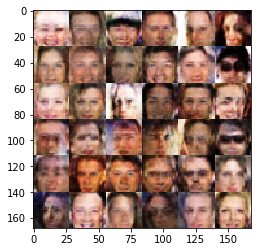

Epoch 2/2... Discriminator Loss: 2.0450... Generator Loss: 0.1898
Epoch 2/2... Discriminator Loss: 1.8599... Generator Loss: 0.4003
Epoch 2/2... Discriminator Loss: 1.8704... Generator Loss: 0.3057
Epoch 2/2... Discriminator Loss: 1.6341... Generator Loss: 0.7295
Epoch 2/2... Discriminator Loss: 0.9075... Generator Loss: 0.9074
Epoch 2/2... Discriminator Loss: 1.8400... Generator Loss: 0.3939
Epoch 2/2... Discriminator Loss: 2.0861... Generator Loss: 0.1547
Epoch 2/2... Discriminator Loss: 1.8904... Generator Loss: 0.2245
Epoch 2/2... Discriminator Loss: 1.7949... Generator Loss: 0.4364
Epoch 2/2... Discriminator Loss: 2.2388... Generator Loss: 0.2295


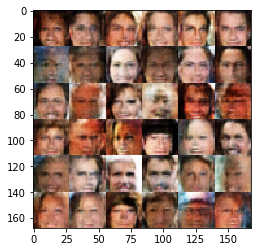

Epoch 2/2... Discriminator Loss: 2.1320... Generator Loss: 0.1839
Epoch 2/2... Discriminator Loss: 1.6550... Generator Loss: 0.4779
Epoch 2/2... Discriminator Loss: 2.0037... Generator Loss: 0.3188
Epoch 2/2... Discriminator Loss: 1.9506... Generator Loss: 0.2540
Epoch 2/2... Discriminator Loss: 1.9606... Generator Loss: 0.2996
Epoch 2/2... Discriminator Loss: 1.6391... Generator Loss: 0.3515
Epoch 2/2... Discriminator Loss: 1.8640... Generator Loss: 0.2604
Epoch 2/2... Discriminator Loss: 2.2653... Generator Loss: 0.1629
Epoch 2/2... Discriminator Loss: 2.2755... Generator Loss: 0.1237
Epoch 2/2... Discriminator Loss: 1.6618... Generator Loss: 0.4132


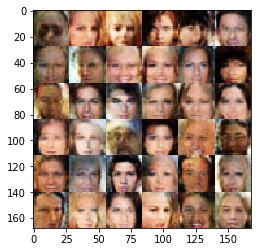

Epoch 2/2... Discriminator Loss: 2.4200... Generator Loss: 0.1124
Epoch 2/2... Discriminator Loss: 1.5146... Generator Loss: 0.3991
Epoch 2/2... Discriminator Loss: 1.8359... Generator Loss: 0.3890
Epoch 2/2... Discriminator Loss: 1.4895... Generator Loss: 0.6776
Epoch 2/2... Discriminator Loss: 1.7413... Generator Loss: 0.3001
Epoch 2/2... Discriminator Loss: 1.8118... Generator Loss: 0.2358
Epoch 2/2... Discriminator Loss: 1.7535... Generator Loss: 0.2784
Epoch 2/2... Discriminator Loss: 2.6186... Generator Loss: 0.0928
Epoch 2/2... Discriminator Loss: 1.8131... Generator Loss: 0.2972
Epoch 2/2... Discriminator Loss: 1.8257... Generator Loss: 0.2660


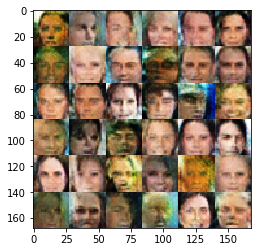

Epoch 2/2... Discriminator Loss: 1.5127... Generator Loss: 0.5400
Epoch 2/2... Discriminator Loss: 2.2702... Generator Loss: 0.1222
Epoch 2/2... Discriminator Loss: 2.0634... Generator Loss: 0.2217
Epoch 2/2... Discriminator Loss: 2.3243... Generator Loss: 0.1360
Epoch 2/2... Discriminator Loss: 2.0808... Generator Loss: 0.1792
Epoch 2/2... Discriminator Loss: 1.9204... Generator Loss: 0.2024
Epoch 2/2... Discriminator Loss: 2.5549... Generator Loss: 0.0953
Epoch 2/2... Discriminator Loss: 2.1862... Generator Loss: 0.2593
Epoch 2/2... Discriminator Loss: 2.2962... Generator Loss: 0.1517
Epoch 2/2... Discriminator Loss: 2.0068... Generator Loss: 0.5581


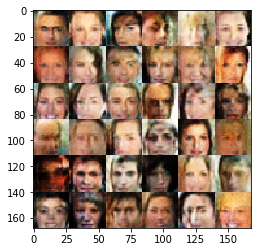

Epoch 2/2... Discriminator Loss: 1.6829... Generator Loss: 0.4390
Epoch 2/2... Discriminator Loss: 1.8517... Generator Loss: 0.2391
Epoch 2/2... Discriminator Loss: 1.8863... Generator Loss: 0.2688
Epoch 2/2... Discriminator Loss: 2.5359... Generator Loss: 0.1153
Epoch 2/2... Discriminator Loss: 2.2313... Generator Loss: 0.1838
Epoch 2/2... Discriminator Loss: 1.7514... Generator Loss: 0.3098
Epoch 2/2... Discriminator Loss: 2.4892... Generator Loss: 0.1144
Epoch 2/2... Discriminator Loss: 1.5669... Generator Loss: 0.5918
Epoch 2/2... Discriminator Loss: 2.5969... Generator Loss: 0.1002
Epoch 2/2... Discriminator Loss: 1.8742... Generator Loss: 0.2720


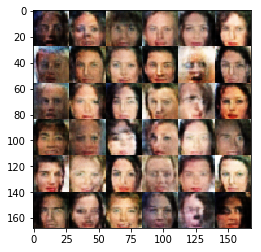

Epoch 2/2... Discriminator Loss: 2.0012... Generator Loss: 0.2134
Epoch 2/2... Discriminator Loss: 1.7447... Generator Loss: 0.2681
Epoch 2/2... Discriminator Loss: 2.0155... Generator Loss: 0.3650
Epoch 2/2... Discriminator Loss: 2.4085... Generator Loss: 0.1413
Epoch 2/2... Discriminator Loss: 1.3611... Generator Loss: 0.4661
Epoch 2/2... Discriminator Loss: 1.7800... Generator Loss: 0.4611
Epoch 2/2... Discriminator Loss: 1.5896... Generator Loss: 0.4110
Epoch 2/2... Discriminator Loss: 2.3221... Generator Loss: 0.2706
Epoch 2/2... Discriminator Loss: 2.3279... Generator Loss: 0.1359
Epoch 2/2... Discriminator Loss: 2.1899... Generator Loss: 0.1901


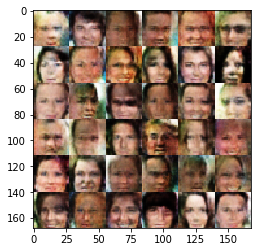

Epoch 2/2... Discriminator Loss: 1.6011... Generator Loss: 0.3211
Epoch 2/2... Discriminator Loss: 2.0671... Generator Loss: 0.1963
Epoch 2/2... Discriminator Loss: 1.9664... Generator Loss: 0.1955
Epoch 2/2... Discriminator Loss: 1.8159... Generator Loss: 0.3900
Epoch 2/2... Discriminator Loss: 2.1757... Generator Loss: 0.1773
Epoch 2/2... Discriminator Loss: 1.5282... Generator Loss: 0.3689
Epoch 2/2... Discriminator Loss: 1.9119... Generator Loss: 0.3104
Epoch 2/2... Discriminator Loss: 1.9873... Generator Loss: 0.2267
Epoch 2/2... Discriminator Loss: 2.0690... Generator Loss: 0.1611
Epoch 2/2... Discriminator Loss: 2.0979... Generator Loss: 0.1629


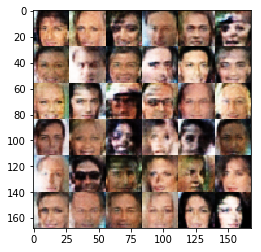

Epoch 2/2... Discriminator Loss: 1.7188... Generator Loss: 0.3818
Epoch 2/2... Discriminator Loss: 1.7750... Generator Loss: 0.4590
Epoch 2/2... Discriminator Loss: 1.6183... Generator Loss: 0.3544
Epoch 2/2... Discriminator Loss: 2.1686... Generator Loss: 0.1653
Epoch 2/2... Discriminator Loss: 2.3385... Generator Loss: 0.1961
Epoch 2/2... Discriminator Loss: 1.7964... Generator Loss: 0.3708
Epoch 2/2... Discriminator Loss: 1.6898... Generator Loss: 0.3006
Epoch 2/2... Discriminator Loss: 1.8297... Generator Loss: 0.3839
Epoch 2/2... Discriminator Loss: 1.9591... Generator Loss: 0.2458
Epoch 2/2... Discriminator Loss: 1.6897... Generator Loss: 0.3789


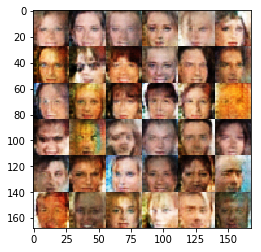

Epoch 2/2... Discriminator Loss: 1.8355... Generator Loss: 0.3401
Epoch 2/2... Discriminator Loss: 1.8593... Generator Loss: 0.2465
Epoch 2/2... Discriminator Loss: 2.0683... Generator Loss: 0.2023
Epoch 2/2... Discriminator Loss: 1.9668... Generator Loss: 0.2151
Epoch 2/2... Discriminator Loss: 1.8426... Generator Loss: 0.2277
Epoch 2/2... Discriminator Loss: 2.2843... Generator Loss: 0.1351
Epoch 2/2... Discriminator Loss: 2.3728... Generator Loss: 0.1635
Epoch 2/2... Discriminator Loss: 2.3200... Generator Loss: 0.1468
Epoch 2/2... Discriminator Loss: 2.1602... Generator Loss: 0.1615
Epoch 2/2... Discriminator Loss: 1.9497... Generator Loss: 0.2965


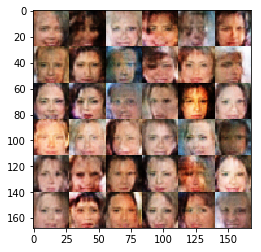

Epoch 2/2... Discriminator Loss: 2.1134... Generator Loss: 0.5064
Epoch 2/2... Discriminator Loss: 1.8422... Generator Loss: 0.2506
Epoch 2/2... Discriminator Loss: 2.0726... Generator Loss: 0.2684
Epoch 2/2... Discriminator Loss: 1.6362... Generator Loss: 0.3079
Epoch 2/2... Discriminator Loss: 1.6390... Generator Loss: 0.4935
Epoch 2/2... Discriminator Loss: 1.9272... Generator Loss: 0.2085
Epoch 2/2... Discriminator Loss: 1.4057... Generator Loss: 0.4492
Epoch 2/2... Discriminator Loss: 2.0224... Generator Loss: 0.4736
Epoch 2/2... Discriminator Loss: 2.2050... Generator Loss: 0.2149
Epoch 2/2... Discriminator Loss: 1.7775... Generator Loss: 0.2832


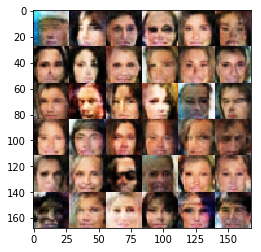

Epoch 2/2... Discriminator Loss: 1.9452... Generator Loss: 0.2541
Epoch 2/2... Discriminator Loss: 1.8021... Generator Loss: 0.2631
Epoch 2/2... Discriminator Loss: 1.8323... Generator Loss: 0.4566
Epoch 2/2... Discriminator Loss: 1.6656... Generator Loss: 0.4731
Epoch 2/2... Discriminator Loss: 2.0362... Generator Loss: 0.2073
Epoch 2/2... Discriminator Loss: 1.7899... Generator Loss: 0.3393
Epoch 2/2... Discriminator Loss: 2.2772... Generator Loss: 0.1424
Epoch 2/2... Discriminator Loss: 1.9582... Generator Loss: 0.1859
Epoch 2/2... Discriminator Loss: 2.3181... Generator Loss: 0.1480
Epoch 2/2... Discriminator Loss: 2.0304... Generator Loss: 0.1714


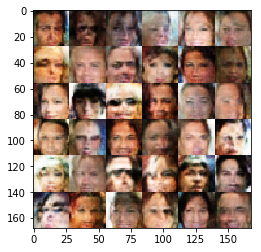

Epoch 2/2... Discriminator Loss: 2.0823... Generator Loss: 0.1675
Epoch 2/2... Discriminator Loss: 1.7224... Generator Loss: 0.3423
Epoch 2/2... Discriminator Loss: 2.4306... Generator Loss: 0.2209
Epoch 2/2... Discriminator Loss: 1.6129... Generator Loss: 0.3191
Epoch 2/2... Discriminator Loss: 2.0429... Generator Loss: 0.1878
Epoch 2/2... Discriminator Loss: 1.8701... Generator Loss: 0.2845
Epoch 2/2... Discriminator Loss: 2.3435... Generator Loss: 0.2157
Epoch 2/2... Discriminator Loss: 2.3220... Generator Loss: 0.2079
Epoch 2/2... Discriminator Loss: 1.6376... Generator Loss: 0.4212
Epoch 2/2... Discriminator Loss: 1.7131... Generator Loss: 0.2598


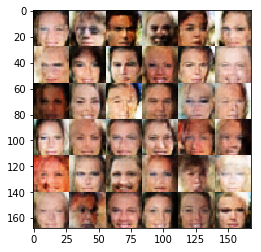

Epoch 2/2... Discriminator Loss: 1.7264... Generator Loss: 0.3031
Epoch 2/2... Discriminator Loss: 2.0421... Generator Loss: 0.2829
Epoch 2/2... Discriminator Loss: 1.7951... Generator Loss: 0.2296
Epoch 2/2... Discriminator Loss: 1.9513... Generator Loss: 0.2051
Epoch 2/2... Discriminator Loss: 2.2112... Generator Loss: 0.1532
Epoch 2/2... Discriminator Loss: 1.7127... Generator Loss: 0.3812
Epoch 2/2... Discriminator Loss: 2.4078... Generator Loss: 0.1946
Epoch 2/2... Discriminator Loss: 1.5244... Generator Loss: 0.3297
Epoch 2/2... Discriminator Loss: 2.0798... Generator Loss: 0.1528
Epoch 2/2... Discriminator Loss: 1.7879... Generator Loss: 0.2457


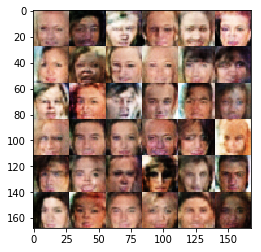

Epoch 2/2... Discriminator Loss: 1.7117... Generator Loss: 0.2999
Epoch 2/2... Discriminator Loss: 2.1287... Generator Loss: 0.1998
Epoch 2/2... Discriminator Loss: 2.3840... Generator Loss: 0.1284
Epoch 2/2... Discriminator Loss: 1.6153... Generator Loss: 0.5363
Epoch 2/2... Discriminator Loss: 1.8622... Generator Loss: 0.2864
Epoch 2/2... Discriminator Loss: 1.7880... Generator Loss: 0.2532
Epoch 2/2... Discriminator Loss: 1.8910... Generator Loss: 0.2155
Epoch 2/2... Discriminator Loss: 1.6452... Generator Loss: 0.3418
Epoch 2/2... Discriminator Loss: 2.1620... Generator Loss: 0.1892
Epoch 2/2... Discriminator Loss: 2.3018... Generator Loss: 0.1458


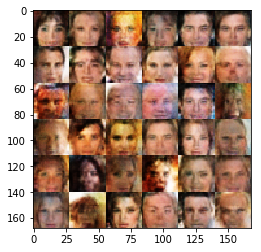

Epoch 2/2... Discriminator Loss: 1.5768... Generator Loss: 0.5969
Epoch 2/2... Discriminator Loss: 1.5822... Generator Loss: 0.5278
Epoch 2/2... Discriminator Loss: 1.6947... Generator Loss: 0.4043
Epoch 2/2... Discriminator Loss: 2.0354... Generator Loss: 0.3021
Epoch 2/2... Discriminator Loss: 2.0142... Generator Loss: 0.2078
Epoch 2/2... Discriminator Loss: 1.9106... Generator Loss: 0.2672
Epoch 2/2... Discriminator Loss: 2.4593... Generator Loss: 0.1312
Epoch 2/2... Discriminator Loss: 1.9379... Generator Loss: 0.3455
Epoch 2/2... Discriminator Loss: 2.0438... Generator Loss: 0.2505
Epoch 2/2... Discriminator Loss: 2.3752... Generator Loss: 0.1200


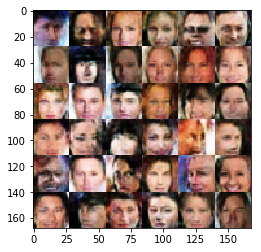

Epoch 2/2... Discriminator Loss: 2.1818... Generator Loss: 0.1544
Epoch 2/2... Discriminator Loss: 1.9531... Generator Loss: 0.3157
Epoch 2/2... Discriminator Loss: 2.1411... Generator Loss: 0.1571
Epoch 2/2... Discriminator Loss: 1.5328... Generator Loss: 0.4166
Epoch 2/2... Discriminator Loss: 2.1237... Generator Loss: 0.2228
Epoch 2/2... Discriminator Loss: 1.5239... Generator Loss: 0.3880
Epoch 2/2... Discriminator Loss: 1.8828... Generator Loss: 0.2427
Epoch 2/2... Discriminator Loss: 1.9390... Generator Loss: 0.2016
Epoch 2/2... Discriminator Loss: 1.7792... Generator Loss: 0.3139
Epoch 2/2... Discriminator Loss: 1.9548... Generator Loss: 0.1846


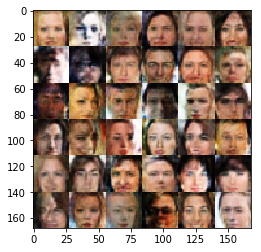

Epoch 2/2... Discriminator Loss: 1.8211... Generator Loss: 0.2760
Epoch 2/2... Discriminator Loss: 1.7645... Generator Loss: 0.3861
Epoch 2/2... Discriminator Loss: 1.9408... Generator Loss: 0.3353
Epoch 2/2... Discriminator Loss: 1.7224... Generator Loss: 0.3173
Epoch 2/2... Discriminator Loss: 2.1560... Generator Loss: 0.1654
Epoch 2/2... Discriminator Loss: 2.0592... Generator Loss: 0.2109
Epoch 2/2... Discriminator Loss: 1.6841... Generator Loss: 0.3545
Epoch 2/2... Discriminator Loss: 2.1063... Generator Loss: 0.1857
Epoch 2/2... Discriminator Loss: 2.1179... Generator Loss: 0.2310
Epoch 2/2... Discriminator Loss: 1.7131... Generator Loss: 0.4888


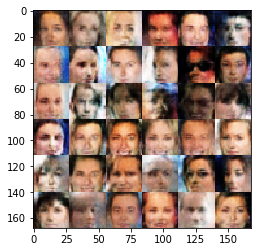

Epoch 2/2... Discriminator Loss: 2.2284... Generator Loss: 0.1584
Epoch 2/2... Discriminator Loss: 2.4544... Generator Loss: 0.1131
Epoch 2/2... Discriminator Loss: 1.8176... Generator Loss: 0.2372
Epoch 2/2... Discriminator Loss: 2.0281... Generator Loss: 0.1768
Epoch 2/2... Discriminator Loss: 1.6121... Generator Loss: 0.3780
Epoch 2/2... Discriminator Loss: 2.0005... Generator Loss: 0.2157
Epoch 2/2... Discriminator Loss: 2.1781... Generator Loss: 0.1556
Epoch 2/2... Discriminator Loss: 2.4195... Generator Loss: 0.1177
Epoch 2/2... Discriminator Loss: 1.9408... Generator Loss: 0.2488
Epoch 2/2... Discriminator Loss: 2.0080... Generator Loss: 0.1784


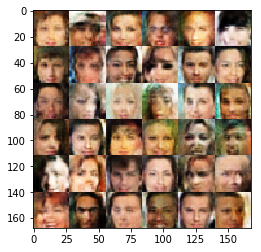

Epoch 2/2... Discriminator Loss: 2.2728... Generator Loss: 0.1826
Epoch 2/2... Discriminator Loss: 2.2351... Generator Loss: 0.1503
Epoch 2/2... Discriminator Loss: 1.4229... Generator Loss: 0.7964
Epoch 2/2... Discriminator Loss: 1.8023... Generator Loss: 0.3143
Epoch 2/2... Discriminator Loss: 1.8792... Generator Loss: 0.4129
Epoch 2/2... Discriminator Loss: 1.6724... Generator Loss: 0.3023
Epoch 2/2... Discriminator Loss: 1.9460... Generator Loss: 0.2061
Epoch 2/2... Discriminator Loss: 1.6583... Generator Loss: 0.3391
Epoch 2/2... Discriminator Loss: 2.2172... Generator Loss: 0.1422
Epoch 2/2... Discriminator Loss: 1.9152... Generator Loss: 0.2266


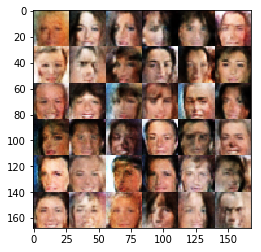

Epoch 2/2... Discriminator Loss: 1.8909... Generator Loss: 0.2632
Epoch 2/2... Discriminator Loss: 2.2664... Generator Loss: 0.1898
Epoch 2/2... Discriminator Loss: 1.8390... Generator Loss: 0.2563
Epoch 2/2... Discriminator Loss: 1.9836... Generator Loss: 0.1986
Epoch 2/2... Discriminator Loss: 2.3608... Generator Loss: 0.1997
Epoch 2/2... Discriminator Loss: 2.4595... Generator Loss: 0.1086
Epoch 2/2... Discriminator Loss: 1.4580... Generator Loss: 0.4805
Epoch 2/2... Discriminator Loss: 2.2203... Generator Loss: 0.1359
Epoch 2/2... Discriminator Loss: 2.5420... Generator Loss: 0.1200
Epoch 2/2... Discriminator Loss: 1.9905... Generator Loss: 0.2393


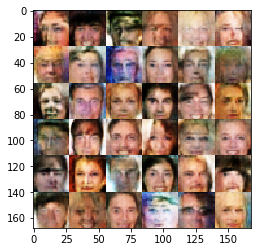

Epoch 2/2... Discriminator Loss: 1.9548... Generator Loss: 0.2865
Epoch 2/2... Discriminator Loss: 1.7207... Generator Loss: 0.2901
Epoch 2/2... Discriminator Loss: 1.7299... Generator Loss: 0.6332
Epoch 2/2... Discriminator Loss: 2.4263... Generator Loss: 0.1329
Epoch 2/2... Discriminator Loss: 1.6230... Generator Loss: 0.4099
Epoch 2/2... Discriminator Loss: 1.8613... Generator Loss: 0.3535
Epoch 2/2... Discriminator Loss: 2.1345... Generator Loss: 0.6148
Epoch 2/2... Discriminator Loss: 2.2092... Generator Loss: 0.1839
Epoch 2/2... Discriminator Loss: 1.6065... Generator Loss: 0.3573
Epoch 2/2... Discriminator Loss: 1.9942... Generator Loss: 0.1943


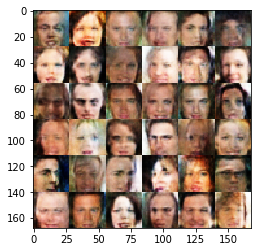

Epoch 2/2... Discriminator Loss: 1.9658... Generator Loss: 0.2541
Epoch 2/2... Discriminator Loss: 1.7479... Generator Loss: 0.3051
Epoch 2/2... Discriminator Loss: 2.0567... Generator Loss: 0.2536
Epoch 2/2... Discriminator Loss: 2.2386... Generator Loss: 0.1714
Epoch 2/2... Discriminator Loss: 1.7898... Generator Loss: 0.2257
Epoch 2/2... Discriminator Loss: 2.3517... Generator Loss: 0.1276
Epoch 2/2... Discriminator Loss: 1.9403... Generator Loss: 0.3577
Epoch 2/2... Discriminator Loss: 1.7225... Generator Loss: 0.2848
Epoch 2/2... Discriminator Loss: 1.9006... Generator Loss: 0.2120
Epoch 2/2... Discriminator Loss: 1.9271... Generator Loss: 0.3264


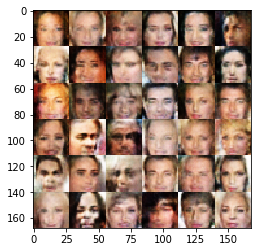

Epoch 2/2... Discriminator Loss: 1.7624... Generator Loss: 0.2619
Epoch 2/2... Discriminator Loss: 1.7556... Generator Loss: 0.2843
Epoch 2/2... Discriminator Loss: 2.1163... Generator Loss: 0.1703
Epoch 2/2... Discriminator Loss: 1.6772... Generator Loss: 0.3453
Epoch 2/2... Discriminator Loss: 2.2004... Generator Loss: 0.1487
Epoch 2/2... Discriminator Loss: 2.0030... Generator Loss: 0.2485
Epoch 2/2... Discriminator Loss: 2.3263... Generator Loss: 0.1320
Epoch 2/2... Discriminator Loss: 1.4886... Generator Loss: 0.3644
Epoch 2/2... Discriminator Loss: 2.2847... Generator Loss: 0.1528
Epoch 2/2... Discriminator Loss: 1.5305... Generator Loss: 0.5821


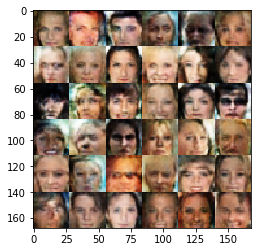

Epoch 2/2... Discriminator Loss: 1.4904... Generator Loss: 0.5757
Epoch 2/2... Discriminator Loss: 2.0927... Generator Loss: 0.2206
Epoch 2/2... Discriminator Loss: 2.0936... Generator Loss: 0.2071
Epoch 2/2... Discriminator Loss: 1.8717... Generator Loss: 0.2772
Epoch 2/2... Discriminator Loss: 1.5925... Generator Loss: 0.3921
Epoch 2/2... Discriminator Loss: 1.7892... Generator Loss: 0.4824
Epoch 2/2... Discriminator Loss: 1.8125... Generator Loss: 0.2244
Epoch 2/2... Discriminator Loss: 1.5723... Generator Loss: 0.4919
Epoch 2/2... Discriminator Loss: 2.8926... Generator Loss: 0.0837
Epoch 2/2... Discriminator Loss: 1.3493... Generator Loss: 0.6671


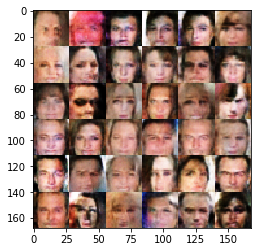

Epoch 2/2... Discriminator Loss: 1.6601... Generator Loss: 0.4163
Epoch 2/2... Discriminator Loss: 2.0218... Generator Loss: 0.1831
Epoch 2/2... Discriminator Loss: 1.4929... Generator Loss: 0.4292
Epoch 2/2... Discriminator Loss: 1.8520... Generator Loss: 0.2670
Epoch 2/2... Discriminator Loss: 1.5132... Generator Loss: 0.4008
Epoch 2/2... Discriminator Loss: 2.1210... Generator Loss: 0.1845
Epoch 2/2... Discriminator Loss: 1.3569... Generator Loss: 0.7398
Epoch 2/2... Discriminator Loss: 1.9658... Generator Loss: 0.3160
Epoch 2/2... Discriminator Loss: 2.3689... Generator Loss: 0.1194
Epoch 2/2... Discriminator Loss: 3.2036... Generator Loss: 0.0588


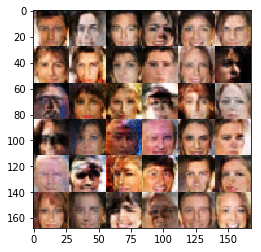

Epoch 2/2... Discriminator Loss: 2.7006... Generator Loss: 0.1110
Epoch 2/2... Discriminator Loss: 1.7133... Generator Loss: 0.4359
Epoch 2/2... Discriminator Loss: 1.6493... Generator Loss: 0.5310
Epoch 2/2... Discriminator Loss: 2.0895... Generator Loss: 0.1776
Epoch 2/2... Discriminator Loss: 2.8863... Generator Loss: 0.0648
Epoch 2/2... Discriminator Loss: 2.0540... Generator Loss: 0.1592
Epoch 2/2... Discriminator Loss: 2.3732... Generator Loss: 0.1796
Epoch 2/2... Discriminator Loss: 2.0205... Generator Loss: 0.1826
Epoch 2/2... Discriminator Loss: 1.7189... Generator Loss: 0.3179
Epoch 2/2... Discriminator Loss: 1.6105... Generator Loss: 0.3725


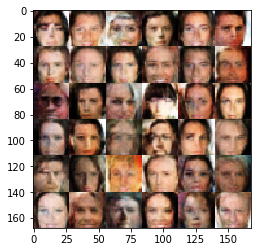

Epoch 2/2... Discriminator Loss: 1.7974... Generator Loss: 0.3936
Epoch 2/2... Discriminator Loss: 2.0021... Generator Loss: 0.1869
Epoch 2/2... Discriminator Loss: 1.4736... Generator Loss: 0.5527
Epoch 2/2... Discriminator Loss: 2.3741... Generator Loss: 0.1274
Epoch 2/2... Discriminator Loss: 2.1092... Generator Loss: 0.1692
Epoch 2/2... Discriminator Loss: 2.2934... Generator Loss: 0.1411
Epoch 2/2... Discriminator Loss: 1.7015... Generator Loss: 0.5233
Epoch 2/2... Discriminator Loss: 1.4722... Generator Loss: 0.4416
Epoch 2/2... Discriminator Loss: 1.7708... Generator Loss: 0.3235
Epoch 2/2... Discriminator Loss: 1.9059... Generator Loss: 0.2327


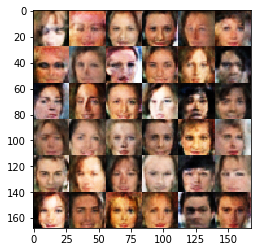

Epoch 2/2... Discriminator Loss: 1.5757... Generator Loss: 0.3875
Epoch 2/2... Discriminator Loss: 2.0811... Generator Loss: 0.4523
Epoch 2/2... Discriminator Loss: 2.1655... Generator Loss: 0.1511
Epoch 2/2... Discriminator Loss: 3.1670... Generator Loss: 0.0588
Epoch 2/2... Discriminator Loss: 2.2196... Generator Loss: 0.1410
Epoch 2/2... Discriminator Loss: 2.2587... Generator Loss: 0.1528
Epoch 2/2... Discriminator Loss: 1.9682... Generator Loss: 0.3455
Epoch 2/2... Discriminator Loss: 1.9719... Generator Loss: 0.1872
Epoch 2/2... Discriminator Loss: 2.6018... Generator Loss: 0.1080
Epoch 2/2... Discriminator Loss: 2.0061... Generator Loss: 0.2399


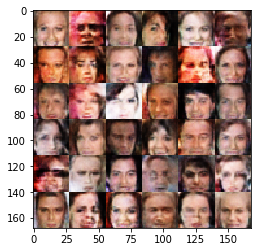

Epoch 2/2... Discriminator Loss: 2.4745... Generator Loss: 0.1198
Epoch 2/2... Discriminator Loss: 1.9389... Generator Loss: 0.2493
Epoch 2/2... Discriminator Loss: 2.1248... Generator Loss: 0.1712
Epoch 2/2... Discriminator Loss: 1.8716... Generator Loss: 0.3941
Epoch 2/2... Discriminator Loss: 1.5439... Generator Loss: 0.3513
Epoch 2/2... Discriminator Loss: 1.6124... Generator Loss: 0.3529
Epoch 2/2... Discriminator Loss: 2.2778... Generator Loss: 0.1615
Epoch 2/2... Discriminator Loss: 1.9289... Generator Loss: 0.2214
Epoch 2/2... Discriminator Loss: 2.0529... Generator Loss: 0.2625
Epoch 2/2... Discriminator Loss: 2.2215... Generator Loss: 0.1424


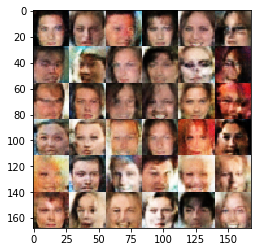

Epoch 2/2... Discriminator Loss: 1.6523... Generator Loss: 0.4812
Epoch 2/2... Discriminator Loss: 1.4157... Generator Loss: 0.4484
Epoch 2/2... Discriminator Loss: 1.9369... Generator Loss: 0.1964
Epoch 2/2... Discriminator Loss: 1.2912... Generator Loss: 0.7107
Epoch 2/2... Discriminator Loss: 1.8820... Generator Loss: 0.1925
Epoch 2/2... Discriminator Loss: 2.7155... Generator Loss: 0.0800
Epoch 2/2... Discriminator Loss: 1.7867... Generator Loss: 0.3857
Epoch 2/2... Discriminator Loss: 2.1427... Generator Loss: 0.4683
Epoch 2/2... Discriminator Loss: 3.0880... Generator Loss: 0.0720
Epoch 2/2... Discriminator Loss: 2.3187... Generator Loss: 0.1585


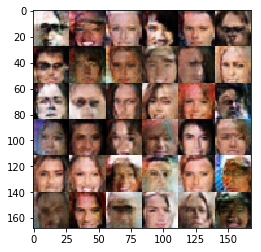

Epoch 2/2... Discriminator Loss: 2.0566... Generator Loss: 0.2043
Epoch 2/2... Discriminator Loss: 0.9561... Generator Loss: 0.9213
Epoch 2/2... Discriminator Loss: 2.1006... Generator Loss: 0.3774
Epoch 2/2... Discriminator Loss: 1.8830... Generator Loss: 0.2568
Epoch 2/2... Discriminator Loss: 2.3525... Generator Loss: 0.1657
Epoch 2/2... Discriminator Loss: 1.8637... Generator Loss: 0.2121
Epoch 2/2... Discriminator Loss: 1.3314... Generator Loss: 0.5311
Epoch 2/2... Discriminator Loss: 2.2814... Generator Loss: 0.1320
Epoch 2/2... Discriminator Loss: 2.3448... Generator Loss: 0.1316
Epoch 2/2... Discriminator Loss: 2.3911... Generator Loss: 0.1188


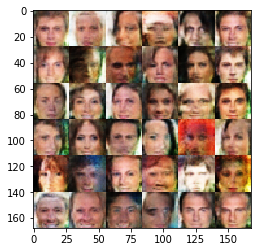

Epoch 2/2... Discriminator Loss: 2.0487... Generator Loss: 0.1971
Epoch 2/2... Discriminator Loss: 1.7772... Generator Loss: 0.2813
Epoch 2/2... Discriminator Loss: 2.8466... Generator Loss: 0.0834
Epoch 2/2... Discriminator Loss: 1.9627... Generator Loss: 0.2136
Epoch 2/2... Discriminator Loss: 1.6161... Generator Loss: 0.4458
Epoch 2/2... Discriminator Loss: 1.4595... Generator Loss: 0.4827
Epoch 2/2... Discriminator Loss: 1.3026... Generator Loss: 0.6074
Epoch 2/2... Discriminator Loss: 1.7431... Generator Loss: 0.2839
Epoch 2/2... Discriminator Loss: 1.8863... Generator Loss: 0.2270
Epoch 2/2... Discriminator Loss: 2.0080... Generator Loss: 0.1865


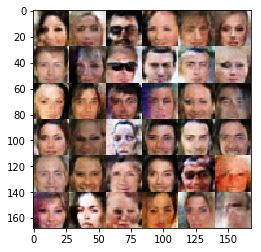

Epoch 2/2... Discriminator Loss: 2.0505... Generator Loss: 0.1767
Epoch 2/2... Discriminator Loss: 2.2569... Generator Loss: 0.1452
Epoch 2/2... Discriminator Loss: 2.0627... Generator Loss: 0.1935
Epoch 2/2... Discriminator Loss: 2.0901... Generator Loss: 0.2641
Epoch 2/2... Discriminator Loss: 1.9761... Generator Loss: 0.3486
Epoch 2/2... Discriminator Loss: 2.1607... Generator Loss: 0.2446
Epoch 2/2... Discriminator Loss: 2.2042... Generator Loss: 0.1411
Epoch 2/2... Discriminator Loss: 1.5183... Generator Loss: 0.4991
Epoch 2/2... Discriminator Loss: 2.4959... Generator Loss: 0.1202
Epoch 2/2... Discriminator Loss: 2.1156... Generator Loss: 0.2175


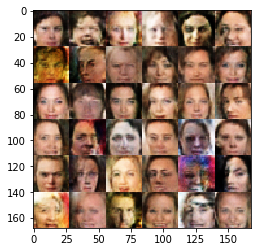

Epoch 2/2... Discriminator Loss: 1.8636... Generator Loss: 0.3445
Epoch 2/2... Discriminator Loss: 2.2232... Generator Loss: 0.1316
Epoch 2/2... Discriminator Loss: 1.9018... Generator Loss: 0.2752
Epoch 2/2... Discriminator Loss: 1.5926... Generator Loss: 0.3914
Epoch 2/2... Discriminator Loss: 1.9913... Generator Loss: 0.2510
Epoch 2/2... Discriminator Loss: 2.5514... Generator Loss: 0.1144
Epoch 2/2... Discriminator Loss: 1.8084... Generator Loss: 0.3058
Epoch 2/2... Discriminator Loss: 2.1796... Generator Loss: 0.1582
Epoch 2/2... Discriminator Loss: 2.2698... Generator Loss: 0.1584
Epoch 2/2... Discriminator Loss: 1.8355... Generator Loss: 0.3505


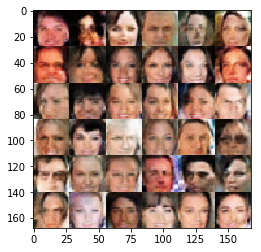

Epoch 2/2... Discriminator Loss: 1.6678... Generator Loss: 0.3202
Epoch 2/2... Discriminator Loss: 1.8806... Generator Loss: 0.4154
Epoch 2/2... Discriminator Loss: 1.7629... Generator Loss: 0.4614
Epoch 2/2... Discriminator Loss: 2.3485... Generator Loss: 0.1303
Epoch 2/2... Discriminator Loss: 2.7680... Generator Loss: 0.0967
Epoch 2/2... Discriminator Loss: 2.0163... Generator Loss: 0.1997
Epoch 2/2... Discriminator Loss: 1.8372... Generator Loss: 0.3007
Epoch 2/2... Discriminator Loss: 1.4840... Generator Loss: 0.4573
Epoch 2/2... Discriminator Loss: 2.3207... Generator Loss: 0.2114
Epoch 2/2... Discriminator Loss: 2.4340... Generator Loss: 0.1196


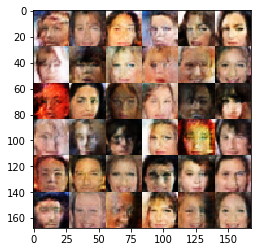

Epoch 2/2... Discriminator Loss: 2.6779... Generator Loss: 0.1560
Epoch 2/2... Discriminator Loss: 2.2060... Generator Loss: 0.1351
Epoch 2/2... Discriminator Loss: 1.7136... Generator Loss: 0.3461
Epoch 2/2... Discriminator Loss: 2.3515... Generator Loss: 0.1323
Epoch 2/2... Discriminator Loss: 2.0520... Generator Loss: 0.1834
Epoch 2/2... Discriminator Loss: 2.5366... Generator Loss: 0.1435
Epoch 2/2... Discriminator Loss: 1.9031... Generator Loss: 0.2223
Epoch 2/2... Discriminator Loss: 2.4200... Generator Loss: 0.1109
Epoch 2/2... Discriminator Loss: 1.7778... Generator Loss: 0.3670
Epoch 2/2... Discriminator Loss: 2.1313... Generator Loss: 0.1798


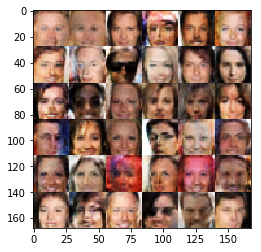

Epoch 2/2... Discriminator Loss: 1.9243... Generator Loss: 0.2457
Epoch 2/2... Discriminator Loss: 1.7922... Generator Loss: 0.2284
Epoch 2/2... Discriminator Loss: 2.0745... Generator Loss: 0.1788
Epoch 2/2... Discriminator Loss: 2.4749... Generator Loss: 0.1102
Epoch 2/2... Discriminator Loss: 1.5681... Generator Loss: 0.3747
Epoch 2/2... Discriminator Loss: 1.8636... Generator Loss: 0.2849
Epoch 2/2... Discriminator Loss: 2.2445... Generator Loss: 0.1451
Epoch 2/2... Discriminator Loss: 1.8762... Generator Loss: 0.2309
Epoch 2/2... Discriminator Loss: 1.6511... Generator Loss: 0.4029
Epoch 2/2... Discriminator Loss: 2.5617... Generator Loss: 0.0936


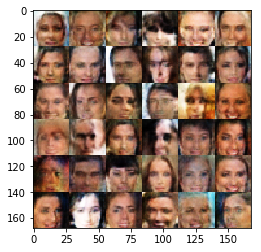

Epoch 2/2... Discriminator Loss: 2.9069... Generator Loss: 0.0824
Epoch 2/2... Discriminator Loss: 2.3942... Generator Loss: 0.2202
Epoch 2/2... Discriminator Loss: 1.6393... Generator Loss: 0.4408
Epoch 2/2... Discriminator Loss: 2.2097... Generator Loss: 0.1614
Epoch 2/2... Discriminator Loss: 1.9634... Generator Loss: 0.2335
Epoch 2/2... Discriminator Loss: 2.4533... Generator Loss: 0.1081
Epoch 2/2... Discriminator Loss: 1.8210... Generator Loss: 0.3225
Epoch 2/2... Discriminator Loss: 2.1910... Generator Loss: 0.1566
Epoch 2/2... Discriminator Loss: 1.8169... Generator Loss: 0.3181
Epoch 2/2... Discriminator Loss: 1.5327... Generator Loss: 0.3731


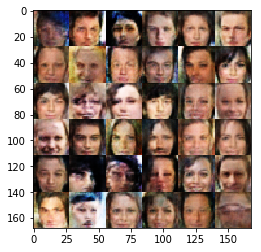

Epoch 2/2... Discriminator Loss: 2.2111... Generator Loss: 0.1420
Epoch 2/2... Discriminator Loss: 2.1422... Generator Loss: 0.1733
Epoch 2/2... Discriminator Loss: 2.2500... Generator Loss: 0.1458
Epoch 2/2... Discriminator Loss: 1.8851... Generator Loss: 0.4450
Epoch 2/2... Discriminator Loss: 2.0599... Generator Loss: 0.1750
Epoch 2/2... Discriminator Loss: 1.8708... Generator Loss: 0.2770
Epoch 2/2... Discriminator Loss: 1.6532... Generator Loss: 0.5721
Epoch 2/2... Discriminator Loss: 1.9552... Generator Loss: 0.2230
Epoch 2/2... Discriminator Loss: 1.8262... Generator Loss: 0.2953
Epoch 2/2... Discriminator Loss: 1.8372... Generator Loss: 0.2569


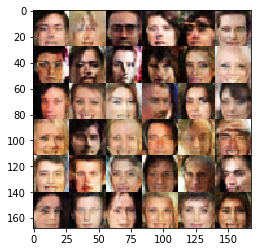

Epoch 2/2... Discriminator Loss: 2.1914... Generator Loss: 0.1402
Epoch 2/2... Discriminator Loss: 1.9217... Generator Loss: 0.2095
Epoch 2/2... Discriminator Loss: 1.8676... Generator Loss: 0.2622
Epoch 2/2... Discriminator Loss: 2.4113... Generator Loss: 0.1510
Epoch 2/2... Discriminator Loss: 2.0005... Generator Loss: 0.1843
Epoch 2/2... Discriminator Loss: 1.6290... Generator Loss: 0.3479
Epoch 2/2... Discriminator Loss: 2.1888... Generator Loss: 0.1487
Epoch 2/2... Discriminator Loss: 1.6767... Generator Loss: 0.3189
Epoch 2/2... Discriminator Loss: 1.8199... Generator Loss: 0.2222
Epoch 2/2... Discriminator Loss: 2.5908... Generator Loss: 0.1009


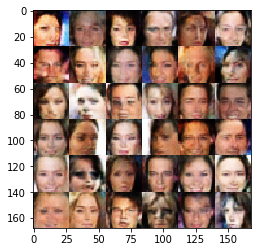

Epoch 2/2... Discriminator Loss: 2.0094... Generator Loss: 0.1828
Epoch 2/2... Discriminator Loss: 1.6748... Generator Loss: 0.3477
Epoch 2/2... Discriminator Loss: 1.2959... Generator Loss: 0.5411
Epoch 2/2... Discriminator Loss: 2.2464... Generator Loss: 0.1356
Epoch 2/2... Discriminator Loss: 1.7538... Generator Loss: 0.4556
Epoch 2/2... Discriminator Loss: 1.8466... Generator Loss: 0.2616
Epoch 2/2... Discriminator Loss: 1.7821... Generator Loss: 0.2230
Epoch 2/2... Discriminator Loss: 2.6010... Generator Loss: 0.0968
Epoch 2/2... Discriminator Loss: 2.2370... Generator Loss: 0.1541
Epoch 2/2... Discriminator Loss: 1.2519... Generator Loss: 0.6777


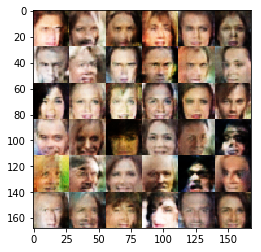

Epoch 2/2... Discriminator Loss: 2.0289... Generator Loss: 0.1844
Epoch 2/2... Discriminator Loss: 1.9201... Generator Loss: 0.2334
Epoch 2/2... Discriminator Loss: 2.0495... Generator Loss: 0.2347
Epoch 2/2... Discriminator Loss: 1.7951... Generator Loss: 0.3016
Epoch 2/2... Discriminator Loss: 1.8128... Generator Loss: 0.2776
Epoch 2/2... Discriminator Loss: 2.1778... Generator Loss: 0.1957
Epoch 2/2... Discriminator Loss: 1.8116... Generator Loss: 0.2734
Epoch 2/2... Discriminator Loss: 2.4219... Generator Loss: 0.2217
Epoch 2/2... Discriminator Loss: 2.2911... Generator Loss: 0.2729
Epoch 2/2... Discriminator Loss: 2.8673... Generator Loss: 0.0864


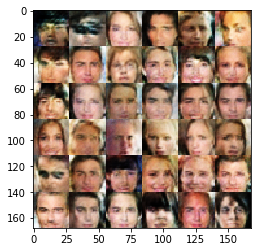

Epoch 2/2... Discriminator Loss: 1.9926... Generator Loss: 0.2600
Epoch 2/2... Discriminator Loss: 1.6665... Generator Loss: 0.4057
Epoch 2/2... Discriminator Loss: 2.3764... Generator Loss: 0.1381
Epoch 2/2... Discriminator Loss: 2.4196... Generator Loss: 0.1196
Epoch 2/2... Discriminator Loss: 2.0344... Generator Loss: 0.3326
Epoch 2/2... Discriminator Loss: 1.6901... Generator Loss: 0.4825
Epoch 2/2... Discriminator Loss: 1.7219... Generator Loss: 0.3816
Epoch 2/2... Discriminator Loss: 1.3405... Generator Loss: 0.5926
Epoch 2/2... Discriminator Loss: 1.9450... Generator Loss: 0.2940
Epoch 2/2... Discriminator Loss: 1.8829... Generator Loss: 0.2149


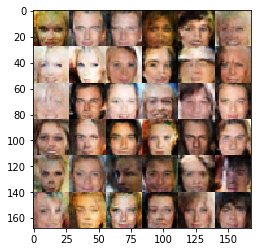

Epoch 2/2... Discriminator Loss: 2.6699... Generator Loss: 0.1153
Epoch 2/2... Discriminator Loss: 2.2118... Generator Loss: 0.2279
Epoch 2/2... Discriminator Loss: 2.2450... Generator Loss: 0.1745
Epoch 2/2... Discriminator Loss: 2.6574... Generator Loss: 0.0817
Epoch 2/2... Discriminator Loss: 2.5069... Generator Loss: 0.1234
Epoch 2/2... Discriminator Loss: 1.7674... Generator Loss: 0.4132
Epoch 2/2... Discriminator Loss: 1.9360... Generator Loss: 0.1963
Epoch 2/2... Discriminator Loss: 1.8706... Generator Loss: 0.2356
Epoch 2/2... Discriminator Loss: 1.9823... Generator Loss: 0.4378
Epoch 2/2... Discriminator Loss: 2.2193... Generator Loss: 0.1674


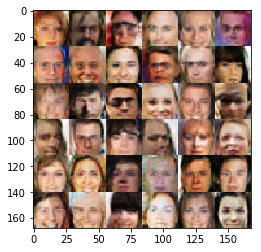

Epoch 2/2... Discriminator Loss: 2.0097... Generator Loss: 0.2434
Epoch 2/2... Discriminator Loss: 1.3880... Generator Loss: 0.5736
Epoch 2/2... Discriminator Loss: 1.9355... Generator Loss: 0.4163
Epoch 2/2... Discriminator Loss: 1.8093... Generator Loss: 0.3352
Epoch 2/2... Discriminator Loss: 2.1357... Generator Loss: 0.1864
Epoch 2/2... Discriminator Loss: 1.5444... Generator Loss: 0.5217
Epoch 2/2... Discriminator Loss: 1.4627... Generator Loss: 0.5300
Epoch 2/2... Discriminator Loss: 2.1787... Generator Loss: 0.1653
Epoch 2/2... Discriminator Loss: 2.0039... Generator Loss: 0.2458
Epoch 2/2... Discriminator Loss: 2.2338... Generator Loss: 0.1938


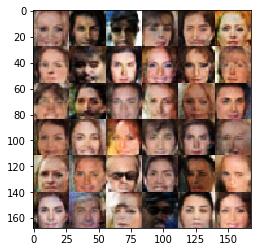

Epoch 2/2... Discriminator Loss: 1.5292... Generator Loss: 0.4575
Epoch 2/2... Discriminator Loss: 2.0445... Generator Loss: 0.3022
Epoch 2/2... Discriminator Loss: 2.2030... Generator Loss: 0.1485
Epoch 2/2... Discriminator Loss: 1.7662... Generator Loss: 0.2875
Epoch 2/2... Discriminator Loss: 2.2023... Generator Loss: 0.1550
Epoch 2/2... Discriminator Loss: 2.0334... Generator Loss: 0.1708
Epoch 2/2... Discriminator Loss: 2.1939... Generator Loss: 0.1711
Epoch 2/2... Discriminator Loss: 1.4002... Generator Loss: 0.5013
Epoch 2/2... Discriminator Loss: 1.9979... Generator Loss: 0.1919
Epoch 2/2... Discriminator Loss: 1.9919... Generator Loss: 0.2752


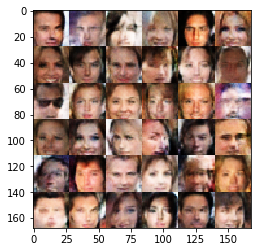

Epoch 2/2... Discriminator Loss: 2.1048... Generator Loss: 0.1810
Epoch 2/2... Discriminator Loss: 3.3723... Generator Loss: 0.0489
Epoch 2/2... Discriminator Loss: 1.5855... Generator Loss: 0.3576
Epoch 2/2... Discriminator Loss: 2.5210... Generator Loss: 0.1223
Epoch 2/2... Discriminator Loss: 2.2200... Generator Loss: 0.1428
Epoch 2/2... Discriminator Loss: 1.9255... Generator Loss: 0.2376
Epoch 2/2... Discriminator Loss: 2.0263... Generator Loss: 0.2815
Epoch 2/2... Discriminator Loss: 1.8452... Generator Loss: 0.2508
Epoch 2/2... Discriminator Loss: 2.0714... Generator Loss: 0.1861
Epoch 2/2... Discriminator Loss: 1.8923... Generator Loss: 0.2972


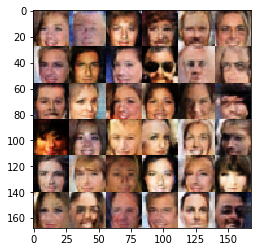

Epoch 2/2... Discriminator Loss: 2.2573... Generator Loss: 0.1592
Epoch 2/2... Discriminator Loss: 1.6189... Generator Loss: 0.3343
Epoch 2/2... Discriminator Loss: 2.1083... Generator Loss: 0.2048
Epoch 2/2... Discriminator Loss: 2.0139... Generator Loss: 0.2101
Epoch 2/2... Discriminator Loss: 1.9744... Generator Loss: 0.1752
Epoch 2/2... Discriminator Loss: 2.1557... Generator Loss: 0.1599
Epoch 2/2... Discriminator Loss: 2.0641... Generator Loss: 0.2577
Epoch 2/2... Discriminator Loss: 1.8490... Generator Loss: 0.2338
Epoch 2/2... Discriminator Loss: 1.5745... Generator Loss: 0.4863
Epoch 2/2... Discriminator Loss: 2.0443... Generator Loss: 0.1954


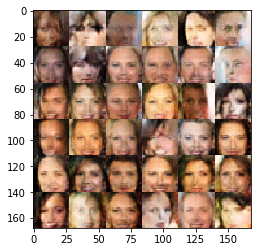

Epoch 2/2... Discriminator Loss: 2.4091... Generator Loss: 0.1191
Epoch 2/2... Discriminator Loss: 2.3283... Generator Loss: 0.1445
Epoch 2/2... Discriminator Loss: 2.2103... Generator Loss: 0.1492
Epoch 2/2... Discriminator Loss: 2.0771... Generator Loss: 0.2046
Epoch 2/2... Discriminator Loss: 2.5117... Generator Loss: 0.1037
Epoch 2/2... Discriminator Loss: 2.2520... Generator Loss: 0.1307
Epoch 2/2... Discriminator Loss: 2.7353... Generator Loss: 0.0936
Epoch 2/2... Discriminator Loss: 2.5992... Generator Loss: 0.0976
Epoch 2/2... Discriminator Loss: 2.2129... Generator Loss: 0.2453
Epoch 2/2... Discriminator Loss: 2.1485... Generator Loss: 0.1506


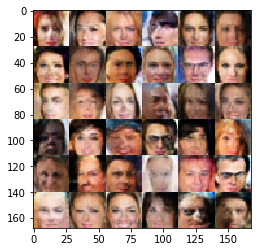

Epoch 2/2... Discriminator Loss: 2.0892... Generator Loss: 0.1811
Epoch 2/2... Discriminator Loss: 1.7368... Generator Loss: 0.3442
Epoch 2/2... Discriminator Loss: 1.8114... Generator Loss: 0.2610
Epoch 2/2... Discriminator Loss: 2.3047... Generator Loss: 0.2025
Epoch 2/2... Discriminator Loss: 1.6781... Generator Loss: 0.3407
Epoch 2/2... Discriminator Loss: 1.7638... Generator Loss: 0.2871
Epoch 2/2... Discriminator Loss: 1.5536... Generator Loss: 0.3874
Epoch 2/2... Discriminator Loss: 1.7107... Generator Loss: 0.2676
Epoch 2/2... Discriminator Loss: 1.7216... Generator Loss: 0.3233
Epoch 2/2... Discriminator Loss: 2.2959... Generator Loss: 0.2090


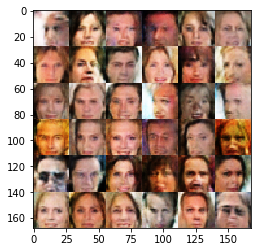

Epoch 2/2... Discriminator Loss: 2.1452... Generator Loss: 0.1501
Epoch 2/2... Discriminator Loss: 1.6795... Generator Loss: 0.2977
Epoch 2/2... Discriminator Loss: 2.1762... Generator Loss: 0.1732
Epoch 2/2... Discriminator Loss: 2.2778... Generator Loss: 0.2218
Epoch 2/2... Discriminator Loss: 2.1060... Generator Loss: 0.2124
Epoch 2/2... Discriminator Loss: 1.8645... Generator Loss: 0.2154
Epoch 2/2... Discriminator Loss: 2.1864... Generator Loss: 0.1512
Epoch 2/2... Discriminator Loss: 2.3773... Generator Loss: 0.2340
Epoch 2/2... Discriminator Loss: 1.9442... Generator Loss: 0.2268
Epoch 2/2... Discriminator Loss: 1.9391... Generator Loss: 0.2798


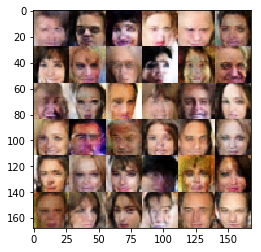

Epoch 2/2... Discriminator Loss: 2.0338... Generator Loss: 0.6400
Epoch 2/2... Discriminator Loss: 2.0296... Generator Loss: 0.1903
Epoch 2/2... Discriminator Loss: 2.1516... Generator Loss: 0.2051
Epoch 2/2... Discriminator Loss: 1.5959... Generator Loss: 0.4195
Epoch 2/2... Discriminator Loss: 1.5927... Generator Loss: 0.3851
Epoch 2/2... Discriminator Loss: 2.1300... Generator Loss: 0.1773
Epoch 2/2... Discriminator Loss: 2.0586... Generator Loss: 0.2116
Epoch 2/2... Discriminator Loss: 2.3053... Generator Loss: 0.1393
Epoch 2/2... Discriminator Loss: 1.9666... Generator Loss: 0.2217
Epoch 2/2... Discriminator Loss: 1.5578... Generator Loss: 0.4629


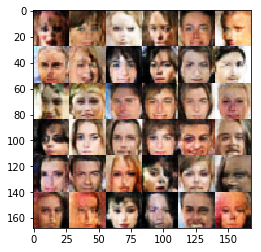

Epoch 2/2... Discriminator Loss: 1.6231... Generator Loss: 0.4017
Epoch 2/2... Discriminator Loss: 2.1075... Generator Loss: 0.2830
Epoch 2/2... Discriminator Loss: 1.8382... Generator Loss: 0.3016
Epoch 2/2... Discriminator Loss: 1.6574... Generator Loss: 0.3033
Epoch 2/2... Discriminator Loss: 1.9821... Generator Loss: 0.2556
Epoch 2/2... Discriminator Loss: 1.5753... Generator Loss: 0.2886
Epoch 2/2... Discriminator Loss: 2.1167... Generator Loss: 0.1673
Epoch 2/2... Discriminator Loss: 1.9279... Generator Loss: 0.3414
Epoch 2/2... Discriminator Loss: 2.2814... Generator Loss: 0.1304
Epoch 2/2... Discriminator Loss: 1.6207... Generator Loss: 1.0467


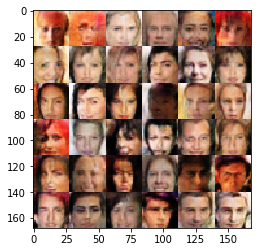

Epoch 2/2... Discriminator Loss: 1.9478... Generator Loss: 0.2004
Epoch 2/2... Discriminator Loss: 2.0992... Generator Loss: 0.2231
Epoch 2/2... Discriminator Loss: 2.2288... Generator Loss: 0.1975
Epoch 2/2... Discriminator Loss: 1.5904... Generator Loss: 0.6098
Epoch 2/2... Discriminator Loss: 2.2466... Generator Loss: 0.1654
Epoch 2/2... Discriminator Loss: 2.0769... Generator Loss: 0.2001
Epoch 2/2... Discriminator Loss: 1.6839... Generator Loss: 0.4337
Epoch 2/2... Discriminator Loss: 1.9858... Generator Loss: 0.1888
Epoch 2/2... Discriminator Loss: 1.6205... Generator Loss: 0.3285
Epoch 2/2... Discriminator Loss: 1.5047... Generator Loss: 0.3854


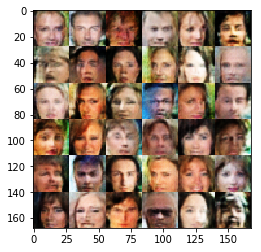

Epoch 2/2... Discriminator Loss: 1.3346... Generator Loss: 0.5582
Epoch 2/2... Discriminator Loss: 2.2369... Generator Loss: 0.1662
Epoch 2/2... Discriminator Loss: 2.3215... Generator Loss: 0.1307
Epoch 2/2... Discriminator Loss: 2.2656... Generator Loss: 0.1331
Epoch 2/2... Discriminator Loss: 1.6325... Generator Loss: 0.5820
Epoch 2/2... Discriminator Loss: 2.4682... Generator Loss: 0.1080
Epoch 2/2... Discriminator Loss: 2.2661... Generator Loss: 0.1309
Epoch 2/2... Discriminator Loss: 1.6885... Generator Loss: 0.4072
Epoch 2/2... Discriminator Loss: 1.9084... Generator Loss: 0.2339
Epoch 2/2... Discriminator Loss: 2.0707... Generator Loss: 0.2365


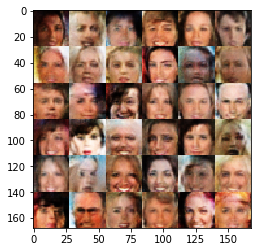

Epoch 2/2... Discriminator Loss: 1.7889... Generator Loss: 0.3722
Epoch 2/2... Discriminator Loss: 1.7951... Generator Loss: 0.3224
Epoch 2/2... Discriminator Loss: 1.9243... Generator Loss: 0.2797
Epoch 2/2... Discriminator Loss: 2.3841... Generator Loss: 0.1862
Epoch 2/2... Discriminator Loss: 2.4363... Generator Loss: 0.1185
Epoch 2/2... Discriminator Loss: 2.1290... Generator Loss: 0.1803
Epoch 2/2... Discriminator Loss: 2.7613... Generator Loss: 0.1633
Epoch 2/2... Discriminator Loss: 2.2010... Generator Loss: 0.1429
Epoch 2/2... Discriminator Loss: 1.6627... Generator Loss: 0.5578
Epoch 2/2... Discriminator Loss: 1.7803... Generator Loss: 0.2878


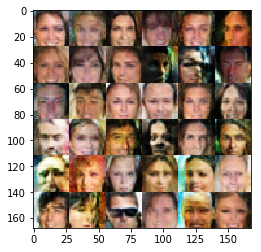

Epoch 2/2... Discriminator Loss: 2.0965... Generator Loss: 0.1730
Epoch 2/2... Discriminator Loss: 1.4841... Generator Loss: 0.5220
Epoch 2/2... Discriminator Loss: 2.2660... Generator Loss: 0.1590
Epoch 2/2... Discriminator Loss: 2.2531... Generator Loss: 0.3081
Epoch 2/2... Discriminator Loss: 1.7355... Generator Loss: 0.2941
Epoch 2/2... Discriminator Loss: 2.3436... Generator Loss: 0.1961
Epoch 2/2... Discriminator Loss: 1.3995... Generator Loss: 0.5732
Epoch 2/2... Discriminator Loss: 1.8539... Generator Loss: 0.3505
Epoch 2/2... Discriminator Loss: 2.5174... Generator Loss: 0.1145
Epoch 2/2... Discriminator Loss: 1.8138... Generator Loss: 0.2595


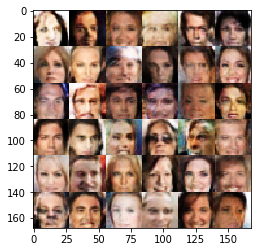

Epoch 2/2... Discriminator Loss: 1.5744... Generator Loss: 0.3737
Epoch 2/2... Discriminator Loss: 2.5255... Generator Loss: 0.1065
Epoch 2/2... Discriminator Loss: 2.1478... Generator Loss: 0.1758
Epoch 2/2... Discriminator Loss: 2.2589... Generator Loss: 0.1368
Epoch 2/2... Discriminator Loss: 2.4729... Generator Loss: 0.1393
Epoch 2/2... Discriminator Loss: 0.8995... Generator Loss: 0.7324
Epoch 2/2... Discriminator Loss: 2.4346... Generator Loss: 0.1468
Epoch 2/2... Discriminator Loss: 1.6616... Generator Loss: 0.6783
Epoch 2/2... Discriminator Loss: 1.5139... Generator Loss: 0.5755
Epoch 2/2... Discriminator Loss: 1.5193... Generator Loss: 0.4512


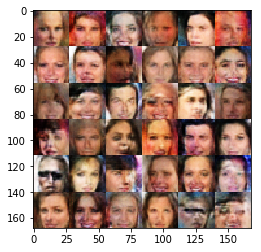

Epoch 2/2... Discriminator Loss: 2.7344... Generator Loss: 0.0934
Epoch 2/2... Discriminator Loss: 2.6529... Generator Loss: 0.0835
Epoch 2/2... Discriminator Loss: 1.9045... Generator Loss: 0.2967
Epoch 2/2... Discriminator Loss: 2.4539... Generator Loss: 0.1182
Epoch 2/2... Discriminator Loss: 2.1261... Generator Loss: 0.1782
Epoch 2/2... Discriminator Loss: 2.7466... Generator Loss: 0.0814
Epoch 2/2... Discriminator Loss: 1.9378... Generator Loss: 0.2120
Epoch 2/2... Discriminator Loss: 1.2632... Generator Loss: 0.4424
Epoch 2/2... Discriminator Loss: 2.1717... Generator Loss: 0.1630
Epoch 2/2... Discriminator Loss: 1.2246... Generator Loss: 0.8661


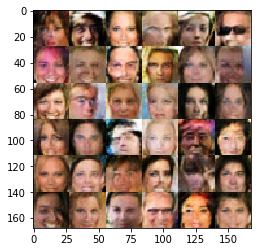

Epoch 2/2... Discriminator Loss: 2.6967... Generator Loss: 0.1006
Epoch 2/2... Discriminator Loss: 2.3585... Generator Loss: 0.1452
Epoch 2/2... Discriminator Loss: 1.6001... Generator Loss: 0.6764
Epoch 2/2... Discriminator Loss: 1.9262... Generator Loss: 0.2478
Epoch 2/2... Discriminator Loss: 2.0040... Generator Loss: 0.2076
Epoch 2/2... Discriminator Loss: 1.8981... Generator Loss: 0.2420
Epoch 2/2... Discriminator Loss: 1.8533... Generator Loss: 0.4602
Epoch 2/2... Discriminator Loss: 1.6179... Generator Loss: 0.3197
Epoch 2/2... Discriminator Loss: 2.1698... Generator Loss: 0.1695
Epoch 2/2... Discriminator Loss: 1.8890... Generator Loss: 0.7161


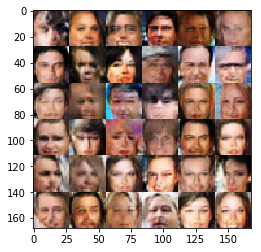

Epoch 2/2... Discriminator Loss: 1.8376... Generator Loss: 0.3644
Epoch 2/2... Discriminator Loss: 1.9098... Generator Loss: 0.2444
Epoch 2/2... Discriminator Loss: 1.9867... Generator Loss: 0.2190
Epoch 2/2... Discriminator Loss: 2.1055... Generator Loss: 0.3186
Epoch 2/2... Discriminator Loss: 1.8358... Generator Loss: 0.3326
Epoch 2/2... Discriminator Loss: 2.3728... Generator Loss: 0.1197
Epoch 2/2... Discriminator Loss: 1.4953... Generator Loss: 0.4254
Epoch 2/2... Discriminator Loss: 2.3094... Generator Loss: 0.2385
Epoch 2/2... Discriminator Loss: 1.6332... Generator Loss: 0.4180
Epoch 2/2... Discriminator Loss: 1.5008... Generator Loss: 0.5109


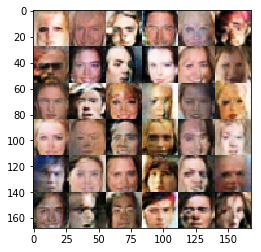

Epoch 2/2... Discriminator Loss: 1.6947... Generator Loss: 0.3935
Epoch 2/2... Discriminator Loss: 2.0729... Generator Loss: 0.2439
Epoch 2/2... Discriminator Loss: 2.0516... Generator Loss: 0.2759
Epoch 2/2... Discriminator Loss: 2.3417... Generator Loss: 0.1252
Epoch 2/2... Discriminator Loss: 1.8570... Generator Loss: 0.2230
Epoch 2/2... Discriminator Loss: 1.9159... Generator Loss: 0.2693


In [13]:
batch_size = 32
z_dim = 1000
learning_rate = 0.0002
beta1 = 0.2
n_images = 36

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.